<a href="https://colab.research.google.com/github/mohammadreza-mohammadi94/Data-Analysis-And-Machine-Learning-Projects/blob/master/8.%20Predictive%20Maintenance%20and%20Reliability%20Engineering/Remaining%20Useful%20Life%20(RUL)%20Prediction%20for%20Jet%20Engines/NASA_Turbofan_Predictive_Maintenance_EngineVitals.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Download Dataset <a id=1></a>
[Dataset Source](https://www.kaggle.com/datasets/behrad3d/nasa-cmaps)

In [1]:
#!/bin/bash
!kaggle datasets download behrad3d/nasa-cmaps
!unzip nasa-cmaps.zip

Dataset URL: https://www.kaggle.com/datasets/behrad3d/nasa-cmaps
License(s): CC0-1.0
  0% 0.00/12.3M [00:00<?, ?B/s]
100% 12.3M/12.3M [00:00<00:00, 154MB/s]
Archive:  nasa-cmaps.zip
  inflating: CMaps/Damage Propagation Modeling.pdf  
  inflating: CMaps/RUL_FD001.txt     
  inflating: CMaps/RUL_FD002.txt     
  inflating: CMaps/RUL_FD003.txt     
  inflating: CMaps/RUL_FD004.txt     
  inflating: CMaps/readme.txt        
  inflating: CMaps/test_FD001.txt    
  inflating: CMaps/test_FD002.txt    
  inflating: CMaps/test_FD003.txt    
  inflating: CMaps/test_FD004.txt    
  inflating: CMaps/train_FD001.txt   
  inflating: CMaps/train_FD002.txt   
  inflating: CMaps/train_FD003.txt   
  inflating: CMaps/train_FD004.txt   
  inflating: CMaps/x.txt             


### **NASA Turbofan Jet Engine Dataset Summary**

The **NASA Turbofan Jet Engine Dataset** is a benchmark dataset for predictive maintenance, focusing on **Prognostics and Health Management (PHM)**. It provides **run-to-failure simulated data** for turbojet engines under various operational and fault scenarios, created using the **C-MAPSS simulator**.

#### **Objective**
Predict the **Remaining Useful Life (RUL)** of engines in the test dataset. RUL represents the number of operational cycles left before the engine fails.

---

### **Dataset Features**
1. **Time Series Data**: Each row represents a single operational cycle of an engine.
2. **Columns**:  
   - **Unit Number**: Identifies the engine.
   - **Cycle**: Time elapsed (in operational cycles).
   - **Operational Settings (3)**: Capture environmental and operational conditions.
   - **Sensor Measurements (21)**: Monitor engine health and degradation.

---

### **Key Characteristics**
1. **Engines**:  
   - Each engine starts in a healthy state and degrades until failure in the training set.  
   - In the test set, data ends before failure, and the RUL is to be predicted.

2. **Challenges**:  
   - **Initial Wear and Variations**: Engines have unknown initial wear levels, treated as normal variations.  
   - **Noise**: Sensor readings are contaminated with noise.  
   - **Multivariate Data**: Complex interactions between operational settings and sensor readings.

---

### **Data Sets**
Four subsets simulate different operational and fault scenarios:

| **Data Set** | **Train Engines** | **Test Engines** | **Conditions** | **Fault Modes**                   |
|--------------|--------------------|------------------|----------------|------------------------------------|
| **FD001**    | 100                | 100              | One (Sea Level) | One (HPC Degradation)              |
| **FD002**    | 260                | 259              | Six            | One (HPC Degradation)              |
| **FD003**    | 100                | 100              | One (Sea Level) | Two (HPC Degradation, Fan Degradation) |
| **FD004**    | 248                | 249              | Six            | Two (HPC Degradation, Fan Degradation) |

---

### **Data Organization**
- **Training Data**: Contains full run-to-failure trajectories for engines.
- **Test Data**: Contains partial trajectories that end before failure. True RUL values are provided for evaluation.

---

### **Applications**
1. Predictive maintenance in industrial machinery.
2. Developing models for time-series analysis and RUL prediction.
3. Benchmarking algorithms for handling **imbalanced data**, **multivariate sensor readings**, and **time-series forecasting**.

This dataset provides a rich environment for testing advanced machine learning techniques, including feature engineering, time-series modeling, and handling real-world data complexities like noise and operational variability.

# 2. Import Libraries <a id=2></a>

In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import tqdm

import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier, XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.ensemble import IsolationForest

# 3. Import Dataset <a id=3></a>

***Define Columns***

In [3]:
def define_cols(sensor_count):
    """
    Define column names based on the number of sensors.
    """
    base_columns = ["unit_number", "time_in_cycle", "ops_setting_1", "ops_setting_2", "ops_setting_3"]
    # sensor_columns = [f"sensor_measurement_{i}" for i in range(1, sensor_count + 1)]
    sensor_columns = ["(Fan inlet temperature) (◦R)",
            "(LPC outlet temperature) (◦R)",
            "(HPC outlet temperature) (◦R)",
            "(LPT outlet temperature) (◦R)",
            "(Fan inlet Pressure) (psia)",
            "(bypass-duct pressure) (psia)",
            "(HPC outlet pressure) (psia)",
            "(Physical fan speed) (rpm)",
            "(Physical core speed) (rpm)",
            "(Engine pressure ratio(P50/P2)",
            "(HPC outlet Static pressure) (psia)",
            "(Ratio of fuel flow to Ps30) (pps/psia)",
            "(Corrected fan speed) (rpm)",
            "(Corrected core speed) (rpm)",
            "(Bypass Ratio) ",
            "(Burner fuel-air ratio)",
            "(Bleed Enthalpy)",
            "(Required fan speed)",
            "(Required fan conversion speed)",
            "(High-pressure turbines Cool air flow)",
            "(Low-pressure turbines Cool air flow)"
        ]
    return base_columns + sensor_columns

***Import Datasets***

In [4]:
BASE_DIR = "/content/CMaps/"

def load_datasets(dataset_id, sensor_count):
    # File paths
    train_file = os.path.join(BASE_DIR, f"train_{dataset_id}.txt")
    test_file = os.path.join(BASE_DIR, f"test_{dataset_id}.txt")
    rul_file = os.path.join(BASE_DIR, f"RUL_{dataset_id}.txt")

    # Define column names
    columns = define_cols(sensor_count)

    # Load training data
    train_data = pd.read_csv(
        train_file,
        delim_whitespace=True,  # Correct handling of space-separated values
        header=None,
        names=columns
    )
    # Drop unnecessary blank columns
    train_data.dropna(axis=1, inplace=True)

    # Load test data
    test_data = pd.read_csv(
        test_file,
        delim_whitespace=True,  # Correct handling of space-separated values
        header=None,
        names=columns
    )
    # Drop unnecessary blank columns
    test_data.dropna(axis=1, inplace=True)

    # Load RUL values for the test set
    true_rul = pd.read_csv(rul_file, delim_whitespace=True, header=None, names=["RUL"])

    # Reset indices to ensure proper alignment
    train_data.reset_index(drop=True, inplace=True)
    test_data.reset_index(drop=True, inplace=True)
    true_rul.reset_index(drop=True, inplace=True)

    # Return datasets
    return train_data, test_data, true_rul

In [5]:
# Load datasets
datasets = {}

for dataset_id, sensor_count in zip(["FD001", "FD002", "FD003", "FD004"], [21, 21, 26, 26]):
    train_data, test_data, true_rul = load_datasets(dataset_id,
                                                   sensor_count)
    datasets[dataset_id] = {
        "train_data": train_data,
        "test_data": test_data,
        "true_rul": true_rul
        }

In [6]:
# FD001
fd001_train = datasets["FD001"]["train_data"]
fd001_test = datasets["FD001"]["test_data"]
fd001_rul = datasets["FD001"]["true_rul"]

fd001_rul['unit_number'] = fd001_rul.index + 1

In [7]:
# FD002
fd002_train = datasets["FD002"]["train_data"]
fd002_test = datasets["FD002"]["test_data"]
fd002_rul = datasets["FD002"]["true_rul"]

fd002_rul['unit_number'] = fd002_rul.index + 1

In [8]:
# FD003
fd003_train = datasets["FD003"]["train_data"]
fd003_test = datasets["FD003"]["test_data"]
fd003_rul = datasets["FD003"]["true_rul"]

fd003_rul['unit_number'] = fd003_rul.index + 1

In [9]:
# FD004
fd004_train = datasets["FD004"]["train_data"]
fd004_test = datasets["FD004"]["test_data"]
fd004_rul = datasets["FD004"]["true_rul"]

fd004_rul['unit_number'] = fd004_rul.index + 1

# 4. Analyze Dataset <a id=4></a>

***FD001***

In [10]:
fd001_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              20631 non-null  int64  
 1   time_in_cycle                            20631 non-null  int64  
 2   ops_setting_1                            20631 non-null  float64
 3   ops_setting_2                            20631 non-null  float64
 4   ops_setting_3                            20631 non-null  float64
 5   (Fan inlet temperature) (◦R)             20631 non-null  float64
 6   (LPC outlet temperature) (◦R)            20631 non-null  float64
 7   (HPC outlet temperature) (◦R)            20631 non-null  float64
 8   (LPT outlet temperature) (◦R)            20631 non-null  float64
 9   (Fan inlet Pressure) (psia)              20631 non-null  float64
 10  (bypass-duct pressure) (psia)            20631

In [11]:
fd001_train.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,20631.0,51.506568,2.922763e+01,1.0000,26.0000,52.0000,77.0000,100.0000
time_in_cycle,20631.0,108.807862,6.888099e+01,1.0000,52.0000,104.0000,156.0000,362.0000
ops_setting_1,20631.0,-0.000009,2.187313e-03,-0.0087,-0.0015,0.0000,0.0015,0.0087
ops_setting_2,20631.0,0.000002,2.930621e-04,-0.0006,-0.0002,0.0000,0.0003,0.0006
ops_setting_3,20631.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet temperature) (◦R),20631.0,518.670000,6.537152e-11,518.6700,518.6700,518.6700,518.6700,518.6700
(LPC outlet temperature) (◦R),20631.0,642.680934,5.000533e-01,641.2100,642.3250,642.6400,643.0000,644.5300
(HPC outlet temperature) (◦R),20631.0,1590.523119,6.131150e+00,1571.0400,1586.2600,1590.1000,1594.3800,1616.9100
(LPT outlet temperature) (◦R),20631.0,1408.933782,9.000605e+00,1382.2500,1402.3600,1408.0400,1414.5550,1441.4900
(Fan inlet Pressure) (psia),20631.0,14.620000,3.394700e-12,14.6200,14.6200,14.6200,14.6200,14.6200


In [12]:
fd001_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              13096 non-null  int64  
 1   time_in_cycle                            13096 non-null  int64  
 2   ops_setting_1                            13096 non-null  float64
 3   ops_setting_2                            13096 non-null  float64
 4   ops_setting_3                            13096 non-null  float64
 5   (Fan inlet temperature) (◦R)             13096 non-null  float64
 6   (LPC outlet temperature) (◦R)            13096 non-null  float64
 7   (HPC outlet temperature) (◦R)            13096 non-null  float64
 8   (LPT outlet temperature) (◦R)            13096 non-null  float64
 9   (Fan inlet Pressure) (psia)              13096 non-null  float64
 10  (bypass-duct pressure) (psia)            13096

In [13]:
fd001_test.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,13096.0,51.543907,2.828942e+01,1.0000,28.0000,52.0000,76.0000,100.0000
time_in_cycle,13096.0,76.836515,5.305775e+01,1.0000,33.0000,69.0000,113.0000,303.0000
ops_setting_1,13096.0,-0.000011,2.202685e-03,-0.0082,-0.0015,-0.0000,0.0015,0.0078
ops_setting_2,13096.0,0.000004,2.940306e-04,-0.0006,-0.0002,-0.0000,0.0003,0.0007
ops_setting_3,13096.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet temperature) (◦R),13096.0,518.670000,6.014263e-11,518.6700,518.6700,518.6700,518.6700,518.6700
(LPC outlet temperature) (◦R),13096.0,642.475088,4.008993e-01,641.1300,642.1975,642.4600,642.7400,644.3000
(HPC outlet temperature) (◦R),13096.0,1588.099204,5.003274e+00,1569.0400,1584.6000,1587.9900,1591.3625,1607.5500
(LPT outlet temperature) (◦R),13096.0,1404.735362,6.688309e+00,1384.3900,1399.9500,1404.4400,1409.0500,1433.3600
(Fan inlet Pressure) (psia),13096.0,14.620000,2.671743e-12,14.6200,14.6200,14.6200,14.6200,14.6200


In [14]:
fd001_rul.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   RUL          100 non-null    int64
 1   unit_number  100 non-null    int64
dtypes: int64(2)
memory usage: 1.7 KB


***FD002***

In [15]:
fd002_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53759 entries, 0 to 53758
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              53759 non-null  int64  
 1   time_in_cycle                            53759 non-null  int64  
 2   ops_setting_1                            53759 non-null  float64
 3   ops_setting_2                            53759 non-null  float64
 4   ops_setting_3                            53759 non-null  float64
 5   (Fan inlet temperature) (◦R)             53759 non-null  float64
 6   (LPC outlet temperature) (◦R)            53759 non-null  float64
 7   (HPC outlet temperature) (◦R)            53759 non-null  float64
 8   (LPT outlet temperature) (◦R)            53759 non-null  float64
 9   (Fan inlet Pressure) (psia)              53759 non-null  float64
 10  (bypass-duct pressure) (psia)            53759

In [16]:
fd002_train.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,53759.0,131.082981,74.463862,1.0000,68.0000,131.0000,195.0000,260.0000
time_in_cycle,53759.0,109.154746,69.180569,1.0000,52.0000,104.0000,157.0000,378.0000
ops_setting_1,53759.0,23.998407,14.747376,0.0000,10.0046,25.0013,41.9980,42.0080
ops_setting_2,53759.0,0.572056,0.310016,0.0000,0.2507,0.7000,0.8400,0.8420
ops_setting_3,53759.0,94.046020,14.237735,60.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet temperature) (◦R),53759.0,472.910207,26.389707,445.0000,445.0000,462.5400,491.1900,518.6700
(LPC outlet temperature) (◦R),53759.0,579.672399,37.289399,535.5300,549.5700,555.9800,607.3400,644.5200
(HPC outlet temperature) (◦R),53759.0,1419.971013,105.946341,1243.7300,1352.7600,1369.1800,1499.3700,1612.8800
(LPT outlet temperature) (◦R),53759.0,1205.442024,119.123428,1023.7700,1123.6550,1138.8900,1306.8500,1439.2300
(Fan inlet Pressure) (psia),53759.0,8.031986,3.613839,3.9100,3.9100,7.0500,10.5200,14.6200


***FD003***

In [17]:
fd003_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24720 entries, 0 to 24719
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              24720 non-null  int64  
 1   time_in_cycle                            24720 non-null  int64  
 2   ops_setting_1                            24720 non-null  float64
 3   ops_setting_2                            24720 non-null  float64
 4   ops_setting_3                            24720 non-null  float64
 5   (Fan inlet temperature) (◦R)             24720 non-null  float64
 6   (LPC outlet temperature) (◦R)            24720 non-null  float64
 7   (HPC outlet temperature) (◦R)            24720 non-null  float64
 8   (LPT outlet temperature) (◦R)            24720 non-null  float64
 9   (Fan inlet Pressure) (psia)              24720 non-null  float64
 10  (bypass-duct pressure) (psia)            24720

In [18]:
fd003_train.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,24720.0,48.631877,2.934899e+01,1.0000,23.0000,47.0000,74.0000,100.0000
time_in_cycle,24720.0,139.077063,9.884668e+01,1.0000,62.0000,124.0000,191.0000,525.0000
ops_setting_1,24720.0,-0.000024,2.193545e-03,-0.0086,-0.0015,-0.0000,0.0015,0.0086
ops_setting_2,24720.0,0.000005,2.940429e-04,-0.0006,-0.0002,-0.0000,0.0003,0.0007
ops_setting_3,24720.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet temperature) (◦R),24720.0,518.670000,6.684921e-11,518.6700,518.6700,518.6700,518.6700,518.6700
(LPC outlet temperature) (◦R),24720.0,642.457858,5.230311e-01,640.8400,642.0800,642.4000,642.7900,645.1100
(HPC outlet temperature) (◦R),24720.0,1588.079175,6.810418e+00,1564.3000,1583.2800,1587.5200,1592.4125,1615.3900
(LPT outlet temperature) (◦R),24720.0,1404.471212,9.773178e+00,1377.0600,1397.1875,1402.9100,1410.6000,1441.1600
(Fan inlet Pressure) (psia),24720.0,14.620000,3.602525e-12,14.6200,14.6200,14.6200,14.6200,14.6200


In [19]:
fd003_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16596 entries, 0 to 16595
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              16596 non-null  int64  
 1   time_in_cycle                            16596 non-null  int64  
 2   ops_setting_1                            16596 non-null  float64
 3   ops_setting_2                            16596 non-null  float64
 4   ops_setting_3                            16596 non-null  float64
 5   (Fan inlet temperature) (◦R)             16596 non-null  float64
 6   (LPC outlet temperature) (◦R)            16596 non-null  float64
 7   (HPC outlet temperature) (◦R)            16596 non-null  float64
 8   (LPT outlet temperature) (◦R)            16596 non-null  float64
 9   (Fan inlet Pressure) (psia)              16596 non-null  float64
 10  (bypass-duct pressure) (psia)            16596

In [20]:
fd003_test.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,16596.0,51.887383,2.985352e+01,1.0000,24.0000,52.0000,78.000000,100.0000
time_in_cycle,16596.0,105.999518,8.328690e+01,1.0000,42.0000,87.0000,149.000000,475.0000
ops_setting_1,16596.0,-0.000017,2.201359e-03,-0.0087,-0.0015,0.0000,0.001500,0.0083
ops_setting_2,16596.0,-0.000004,2.941945e-04,-0.0006,-0.0003,0.0000,0.000300,0.0006
ops_setting_3,16596.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.000000,100.0000
(Fan inlet temperature) (◦R),16596.0,518.670000,6.309810e-11,518.6700,518.6700,518.6700,518.670000,518.6700
(LPC outlet temperature) (◦R),16596.0,642.267980,4.188497e-01,640.9100,641.9800,642.2400,642.550000,644.0300
(HPC outlet temperature) (◦R),16596.0,1585.608286,5.538577e+00,1565.0800,1581.8475,1585.4600,1589.240000,1607.1300
(LPT outlet temperature) (◦R),16596.0,1400.567943,7.150365e+00,1379.3800,1395.4400,1399.8400,1405.230000,1430.2100
(Fan inlet Pressure) (psia),16596.0,14.620000,3.089178e-12,14.6200,14.6200,14.6200,14.620000,14.6200


***FD004***

In [21]:
fd004_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61249 entries, 0 to 61248
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              61249 non-null  int64  
 1   time_in_cycle                            61249 non-null  int64  
 2   ops_setting_1                            61249 non-null  float64
 3   ops_setting_2                            61249 non-null  float64
 4   ops_setting_3                            61249 non-null  float64
 5   (Fan inlet temperature) (◦R)             61249 non-null  float64
 6   (LPC outlet temperature) (◦R)            61249 non-null  float64
 7   (HPC outlet temperature) (◦R)            61249 non-null  float64
 8   (LPT outlet temperature) (◦R)            61249 non-null  float64
 9   (Fan inlet Pressure) (psia)              61249 non-null  float64
 10  (bypass-duct pressure) (psia)            61249

In [22]:
fd004_train.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,61249.0,124.325181,71.995350,1.0000,60.0000,126.0000,185.0000,249.0000
time_in_cycle,61249.0,134.311417,89.783389,1.0000,62.0000,123.0000,191.0000,543.0000
ops_setting_1,61249.0,23.999823,14.780722,0.0000,10.0046,25.0014,41.9981,42.0080
ops_setting_2,61249.0,0.571347,0.310703,0.0000,0.2507,0.7000,0.8400,0.8420
ops_setting_3,61249.0,94.031576,14.251954,60.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet temperature) (◦R),61249.0,472.882435,26.436832,445.0000,445.0000,462.5400,491.1900,518.6700
(LPC outlet temperature) (◦R),61249.0,579.420056,37.342647,535.4800,549.3300,555.7400,607.0700,644.4200
(HPC outlet temperature) (◦R),61249.0,1417.896600,106.167598,1242.6700,1350.5500,1367.6800,1497.4200,1613.0000
(LPT outlet temperature) (◦R),61249.0,1201.915359,119.327591,1024.4200,1119.4900,1136.9200,1302.6200,1440.7700
(Fan inlet Pressure) (psia),61249.0,8.031626,3.622872,3.9100,3.9100,7.0500,10.5200,14.6200


In [23]:
fd004_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41214 entries, 0 to 41213
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   unit_number                              41214 non-null  int64  
 1   time_in_cycle                            41214 non-null  int64  
 2   ops_setting_1                            41214 non-null  float64
 3   ops_setting_2                            41214 non-null  float64
 4   ops_setting_3                            41214 non-null  float64
 5   (Fan inlet temperature) (◦R)             41214 non-null  float64
 6   (LPC outlet temperature) (◦R)            41214 non-null  float64
 7   (HPC outlet temperature) (◦R)            41214 non-null  float64
 8   (LPT outlet temperature) (◦R)            41214 non-null  float64
 9   (Fan inlet Pressure) (psia)              41214 non-null  float64
 10  (bypass-duct pressure) (psia)            41214

In [24]:
fd004_test.describe().T

,count,mean,std,min,25%,50%,75%,max
unit_number,41214.0,120.006017,71.685208,1.0000,57.000000,118.00000,181.000000,248.0000
time_in_cycle,41214.0,108.739094,83.717459,1.0000,43.000000,91.00000,155.000000,486.0000
ops_setting_1,41214.0,24.115207,14.714512,0.0000,10.004700,25.00150,41.998100,42.0080
ops_setting_2,41214.0,0.574725,0.308868,0.0000,0.250700,0.70000,0.840000,0.8420
ops_setting_3,41214.0,94.072888,14.211218,60.0000,100.000000,100.00000,100.000000,100.0000
(Fan inlet temperature) (◦R),41214.0,472.711616,26.321455,445.0000,445.000000,462.54000,491.190000,518.6700
(LPC outlet temperature) (◦R),41214.0,579.069264,37.129671,535.4200,549.200000,555.54000,606.910000,643.9400
(HPC outlet temperature) (◦R),41214.0,1414.951596,105.423125,1240.9400,1348.590000,1364.63000,1494.990000,1608.0500
(LPT outlet temperature) (◦R),41214.0,1197.321054,118.206367,1024.9000,1116.800000,1130.30000,1299.440000,1429.4600
(Fan inlet Pressure) (psia),41214.0,8.003346,3.602107,3.9100,3.910000,7.05000,10.520000,14.6200


## 4.1 Merge Datasets <a id=4.1></a>

In [170]:
FD001 = fd001_train.merge(fd001_rul, on='unit_number', how='left')
FD002 = fd002_train.merge(fd002_rul, on='unit_number', how='left')
FD003 = fd003_train.merge(fd003_rul, on='unit_number', how='left')
FD004 = fd004_train.merge(fd004_rul, on='unit_number', how='left')

In [171]:
df = pd.concat([FD001, FD002, FD003, FD004], axis=1)

In [172]:
FD001.head(1)

,unit_number,time_in_cycle,ops_setting_1,ops_setting_2,ops_setting_3,(Fan inlet temperature) (◦R),(LPC outlet temperature) (◦R),(HPC outlet temperature) (◦R),(LPT outlet temperature) (◦R),(Fan inlet Pressure) (psia),...,(Corrected fan speed) (rpm),(Corrected core speed) (rpm),(Bypass Ratio),(Burner fuel-air ratio),(Bleed Enthalpy),(Required fan speed),(Required fan conversion speed),(High-pressure turbines Cool air flow),(Low-pressure turbines Cool air flow),RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.7,1400.6,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.419,112


## 4.2 Define Sensors Dcitionary <a id=4.2></a>

In [29]:
dict_list = ["(Fan inlet temperature) (◦R)",
            "(LPC outlet temperature) (◦R)",
            "(HPC outlet temperature) (◦R)",
            "(LPT outlet temperature) (◦R)",
            "(Fan inlet Pressure) (psia)",
            "(bypass-duct pressure) (psia)",
            "(HPC outlet pressure) (psia)",
            "(Physical fan speed) (rpm)",
            "(Physical core speed) (rpm)",
            "(Engine pressure ratio(P50/P2)",
            "(HPC outlet Static pressure) (psia)",
            "(Ratio of fuel flow to Ps30) (pps/psia)",
            "(Corrected fan speed) (rpm)",
            "(Corrected core speed) (rpm)",
            "(Bypass Ratio) ",
            "(Burner fuel-air ratio)",
            "(Bleed Enthalpy)",
            "(Required fan speed)",
            "(Required fan conversion speed)",
            "(High-pressure turbines Cool air flow)",
            "(Low-pressure turbines Cool air flow)"
        ]

sensor_dictionary={}

i=1
for x in dict_list :
    sensor_dictionary['sensor_measurement_'+str(i)] = x
    i+=1

sensor_dictionary

{'sensor_measurement_1': '(Fan inlet temperature) (◦R)',
 'sensor_measurement_2': '(LPC outlet temperature) (◦R)',
 'sensor_measurement_3': '(HPC outlet temperature) (◦R)',
 'sensor_measurement_4': '(LPT outlet temperature) (◦R)',
 'sensor_measurement_5': '(Fan inlet Pressure) (psia)',
 'sensor_measurement_6': '(bypass-duct pressure) (psia)',
 'sensor_measurement_7': '(HPC outlet pressure) (psia)',
 'sensor_measurement_8': '(Physical fan speed) (rpm)',
 'sensor_measurement_9': '(Physical core speed) (rpm)',
 'sensor_measurement_10': '(Engine pressure ratio(P50/P2)',
 'sensor_measurement_11': '(HPC outlet Static pressure) (psia)',
 'sensor_measurement_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 'sensor_measurement_13': '(Corrected fan speed) (rpm)',
 'sensor_measurement_14': '(Corrected core speed) (rpm)',
 'sensor_measurement_15': '(Bypass Ratio) ',
 'sensor_measurement_16': '(Burner fuel-air ratio)',
 'sensor_measurement_17': '(Bleed Enthalpy)',
 'sensor_measurement_18': '(Requir

# 5. Explore Dataset <a id=5></a>

## 5.1 Distribution Of Engine Life & RUL <a id=5.1></a>

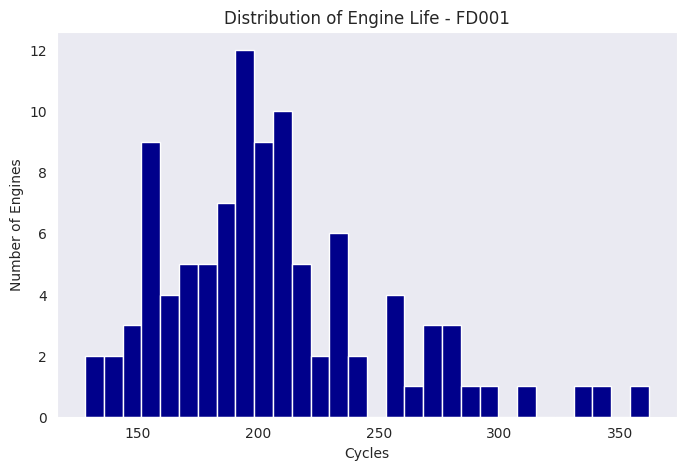

In [30]:
life_distribution = fd001_train.groupby('unit_number')['time_in_cycle'].max()
sns.set_style('dark')
plt.figure(figsize=(6, 5))
life_distribution.hist(bins=30, color='darkblue', grid=False)
plt.title('Distribution of Engine Life - FD001')
plt.xlabel('Cycles')
plt.ylabel('Number of Engines')
plt.show()

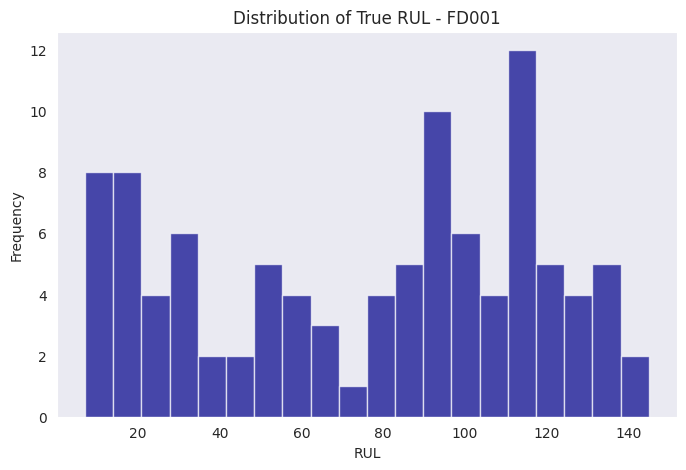

In [31]:
plt.figure(figsize=(6, 5))
sns.set_style('dark')
plt.hist(fd001_rul['RUL'], bins=20, color='darkblue', alpha=0.7)
plt.title('Distribution of True RUL - FD001')
plt.xlabel('RUL')
plt.ylabel('Frequency')
plt.show()

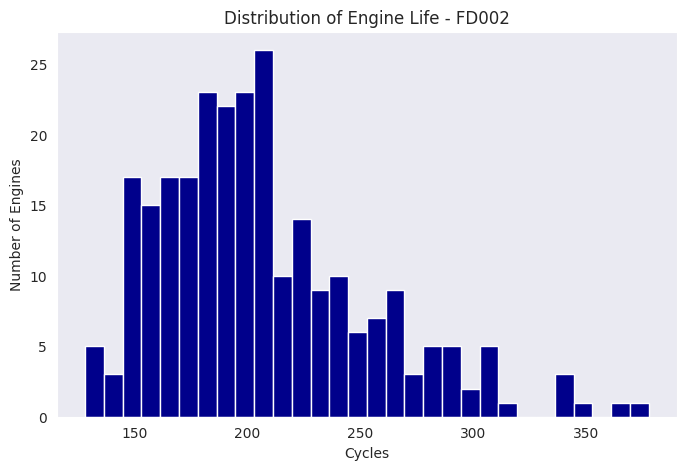

In [32]:
life_distribution = fd002_train.groupby('unit_number')['time_in_cycle'].max()
sns.set_style('dark')
plt.figure(figsize=(6, 5))
life_distribution.hist(bins=30, color='darkblue', grid=False)
plt.title('Distribution of Engine Life - FD002')
plt.xlabel('Cycles')
plt.ylabel('Number of Engines')
plt.show()

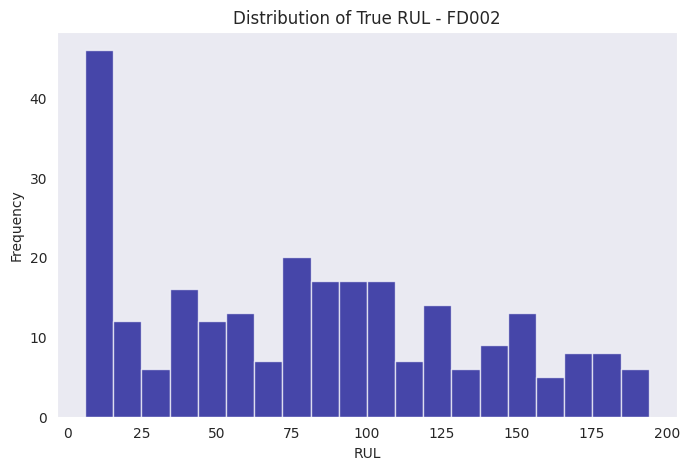

In [33]:
plt.figure(figsize=(6, 5))
sns.set_style('dark')
plt.hist(fd002_rul['RUL'], bins=20, color='darkblue', alpha=0.7)
plt.title('Distribution of True RUL - FD002')
plt.xlabel('RUL')
plt.ylabel('Frequency')
plt.show()

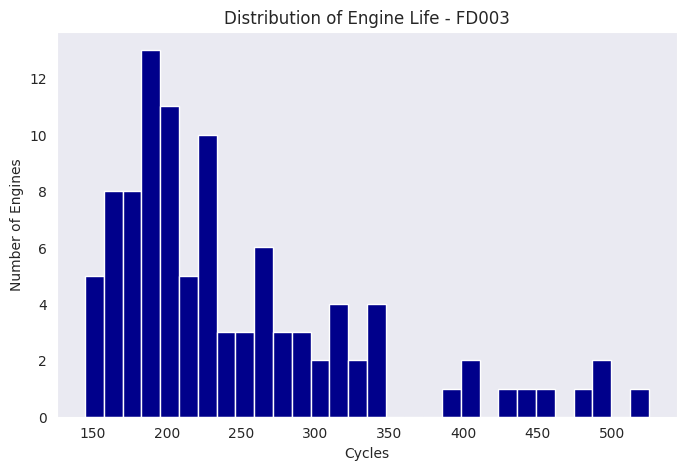

In [34]:
life_distribution = FD003.groupby('unit_number')['time_in_cycle'].max()
sns.set_style('dark')
plt.figure(figsize=(6, 5))
life_distribution.hist(bins=30, color='darkblue', grid=False)
plt.title('Distribution of Engine Life - FD003')
plt.xlabel('Cycles')
plt.ylabel('Number of Engines')
plt.show()

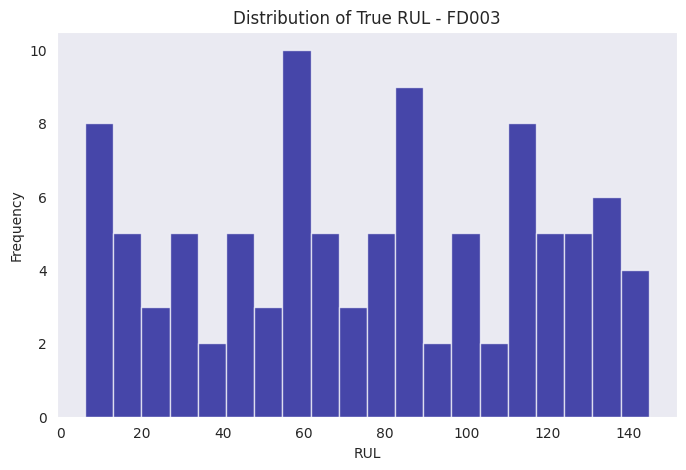

In [35]:
plt.figure(figsize=(6, 5))
sns.set_style('dark')
plt.hist(fd003_rul['RUL'], bins=20, color='darkblue', alpha=0.7)
plt.title('Distribution of True RUL - FD003')
plt.xlabel('RUL')
plt.ylabel('Frequency')
plt.show()

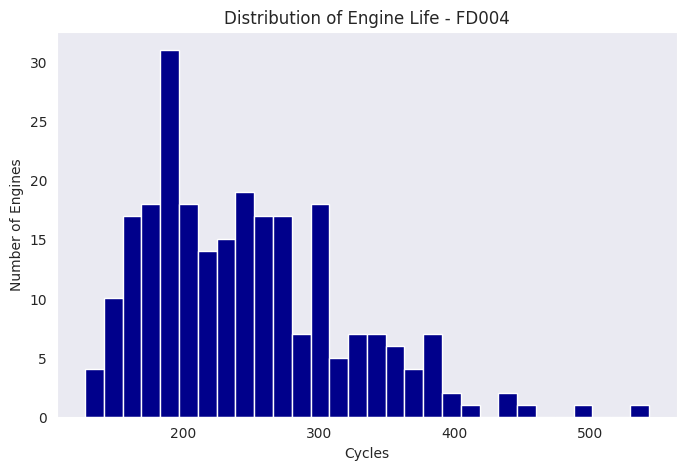

In [36]:
life_distribution = fd004_train.groupby('unit_number')['time_in_cycle'].max()
sns.set_style('dark')
plt.figure(figsize=(6, 5))
life_distribution.hist(bins=30, color='darkblue', grid=False)
plt.title('Distribution of Engine Life - FD004')
plt.xlabel('Cycles')
plt.ylabel('Number of Engines')
plt.show()

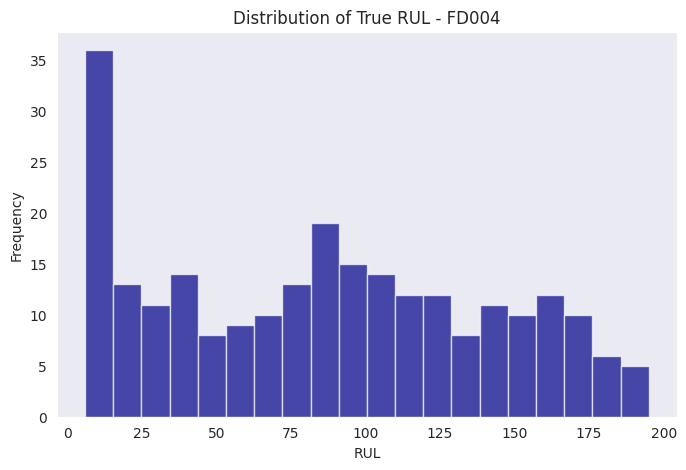

In [37]:
plt.figure(figsize=(6, 5))
sns.set_style('dark')
plt.hist(fd004_rul['RUL'], bins=20, color='darkblue', alpha=0.7)
plt.title('Distribution of True RUL - FD004')
plt.xlabel('RUL')
plt.ylabel('Frequency')
plt.show()

## 5.2 Turbofan Engines Lifetime <a id=5.2></a>

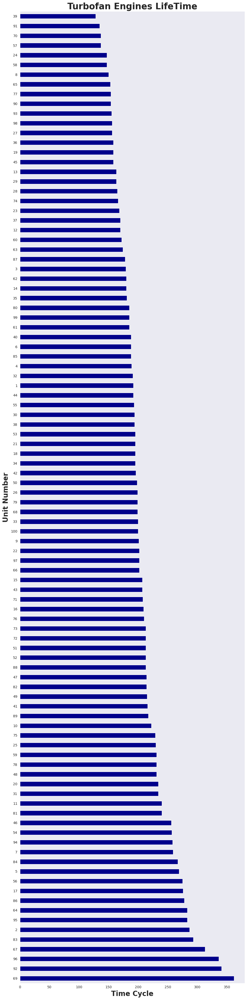

In [38]:
max_time_cycles=fd001_train.groupby('unit_number').max()
sns.set_style('dark')
plt.figure(figsize=(10,40))
max_time_cycles['time_in_cycle'].sort_values(ascending=False).plot(kind='barh',width=0.5, stacked=True, align='center', color='darkblue')
plt.title('Turbofan Engines LifeTime', fontweight='bold', size=25)
plt.xlabel('Time Cycle',fontweight='bold',size=20)
plt.ylabel('Unit Number',fontweight='bold',size=20)
plt.tight_layout()
plt.show()

## 5.3 Visualize The Behavior Of Sensors By Unit Number <a id=5.3></a>

### FD001

In [39]:
def plot_unit_sensors(data,
                      unit_id,
                      line_color='red'):
    """
    Plots all sensor measurements versus time_in_cycle for a specific unit ID.

    Parameters:
    - data: DataFrame containing the dataset (e.g., train_data).
    - unit_id: Integer representing the specific unit_number to plot.
    - sensor_dict: Dictionary mapping sensor column names to their descriptions.
    """
    unit_data = data[data['unit_number'] == unit_id]
    if unit_data.empty:
        print(f"No data found for Unit ID: {unit_id}")

    # Initialize the plot
    plt.figure(figsize=(10, 7))

    # Iterate over sensor names to plot each one
    for i, name in enumerate(data.columns[1:], 1):
        plt.figure(figsize=(10, 5))
        subset = data[data['unit_number'] == unit_id]
        plt.plot(subset['time_in_cycle'],
                 subset[name],
                 label=f'Unit {unit_id}',
                 color=line_color)

        # Define informations on plot
        plt.title(f"Sensor Measurement of Unit ID {unit_id}", fontsize=16, fontweight='bold')
        plt.xlabel("Time in Cycle", fontsize=12, fontweight='bold')
        plt.ylabel(f"Sensor Measurement {name}", fontsize=12, fontweight='bold')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

<Figure size 1000x700 with 0 Axes>

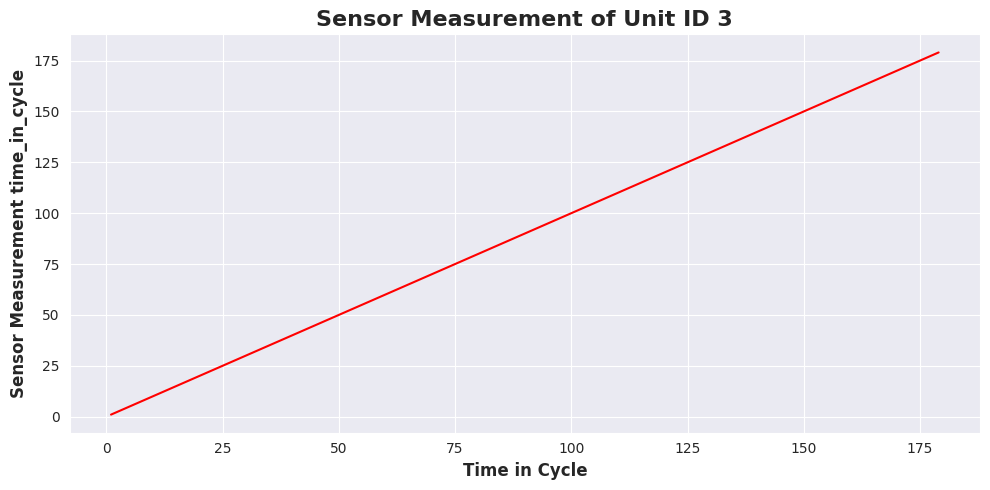

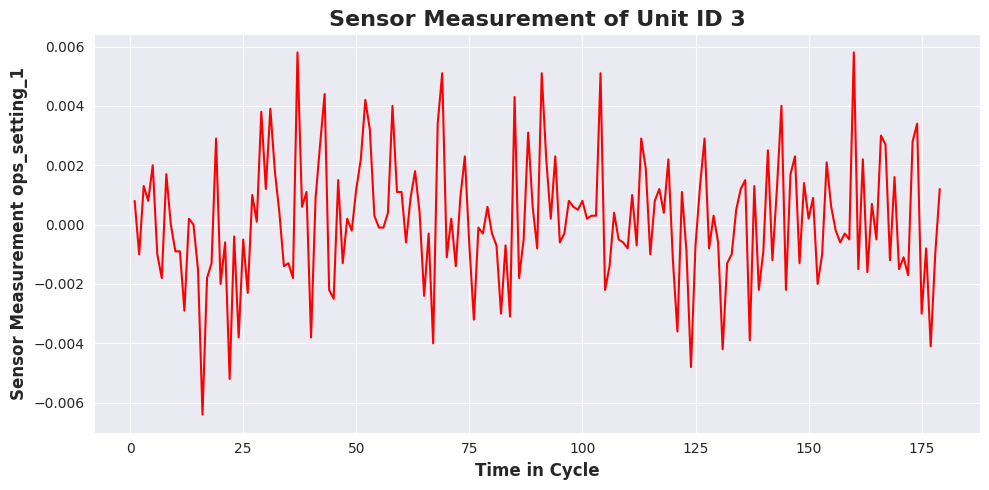

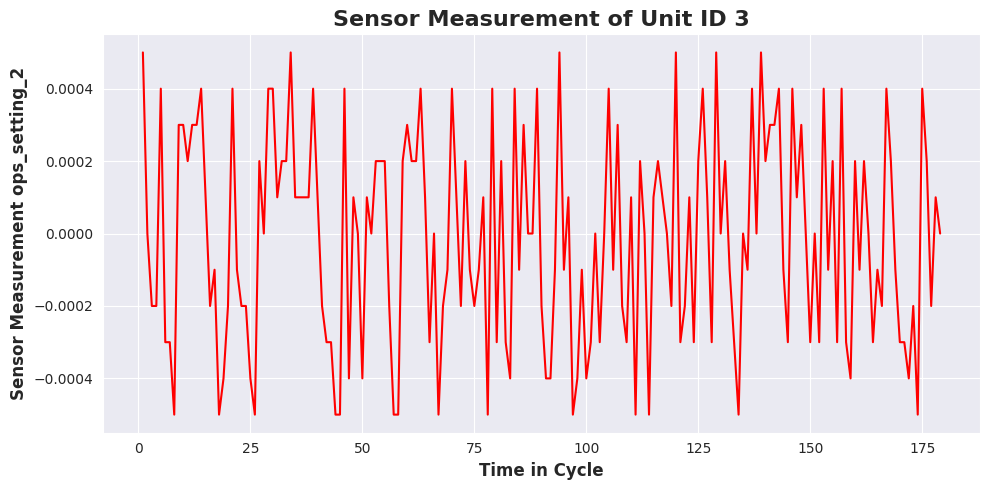

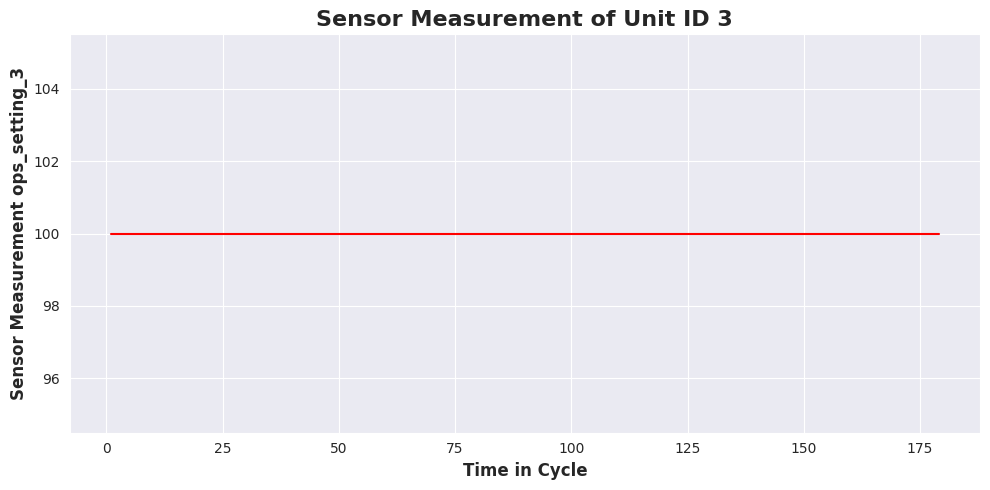

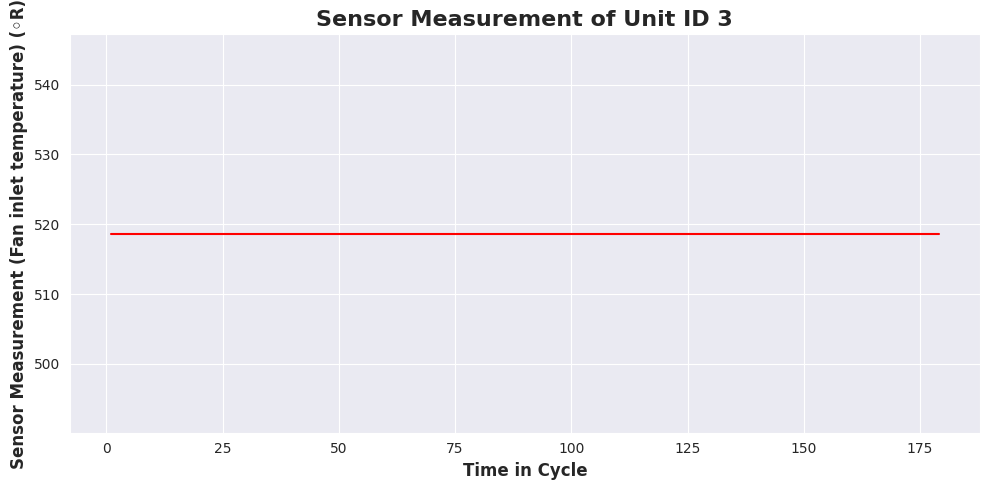

...

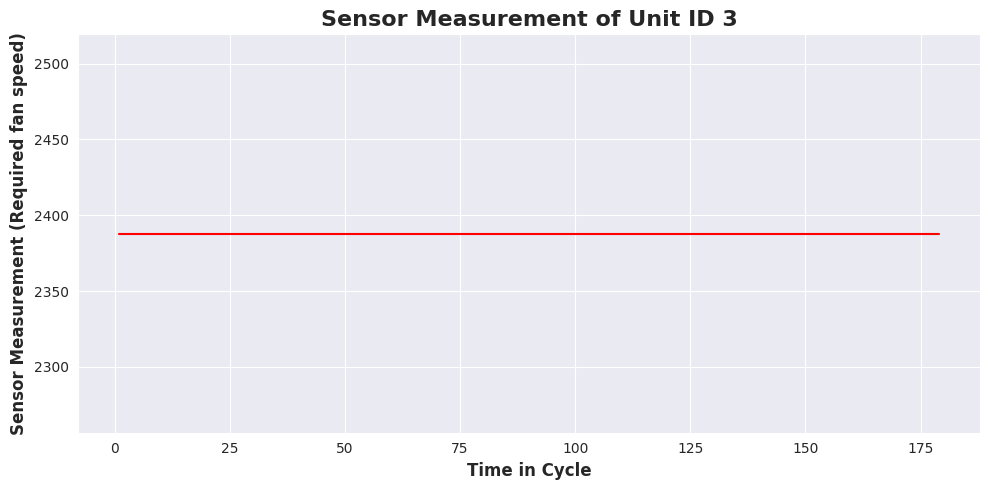

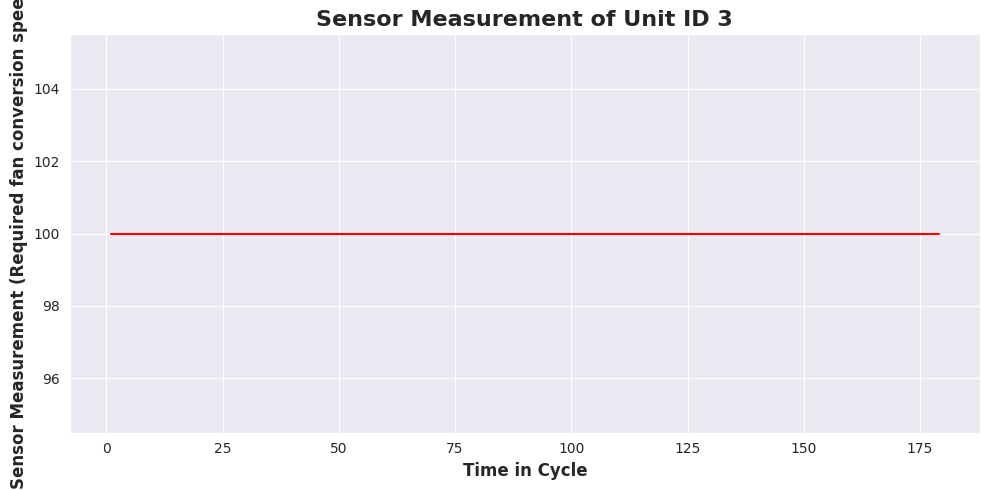

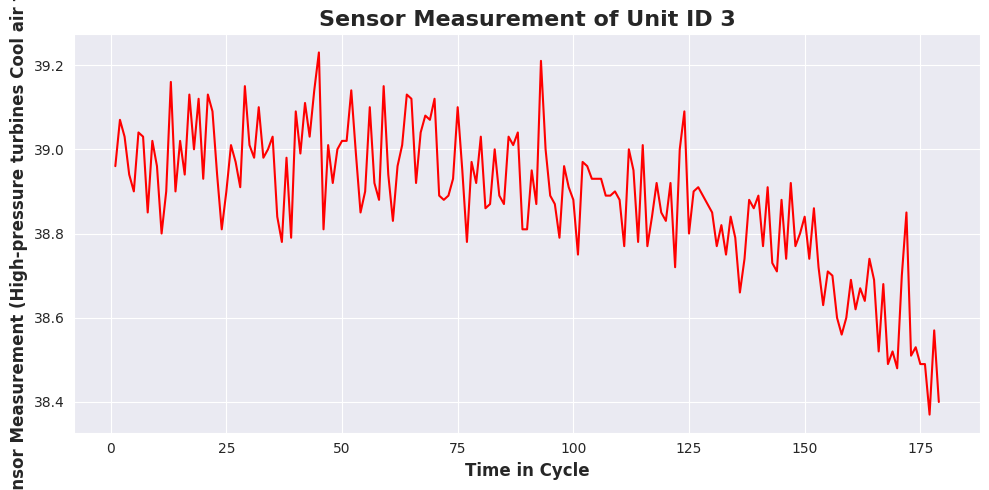

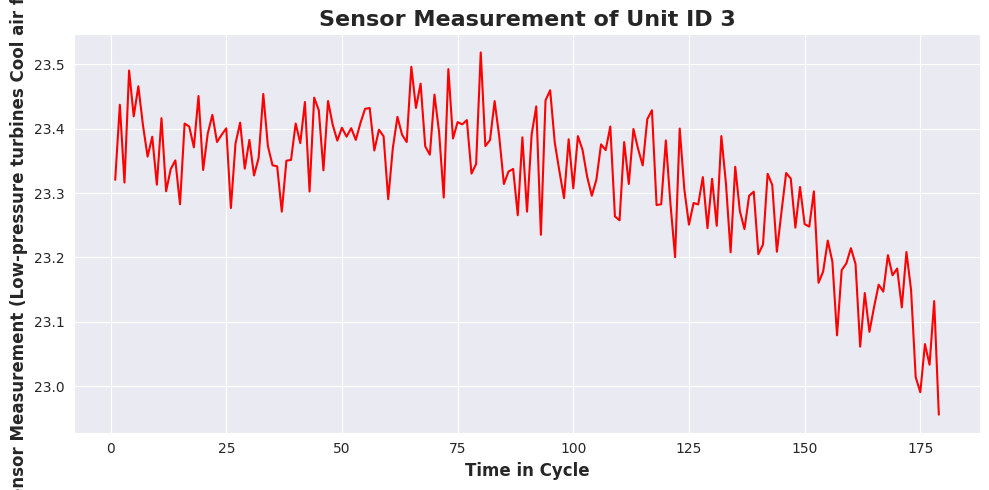

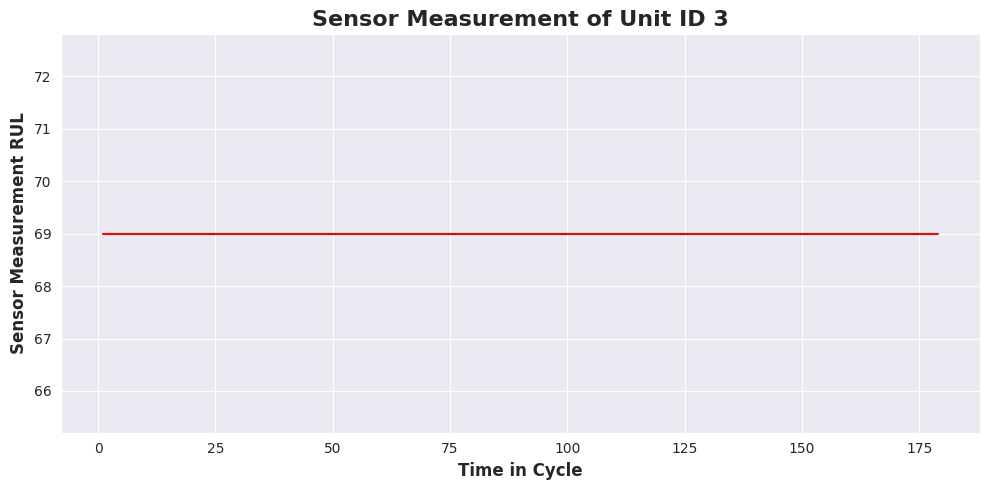

In [40]:
plot_unit_sensors(data=FD001,
                  unit_id=3)

<Figure size 1000x700 with 0 Axes>

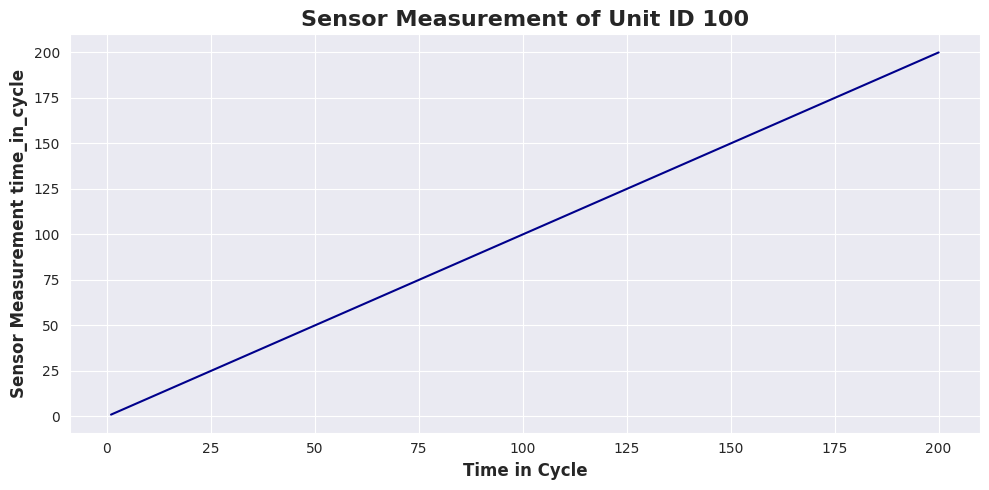

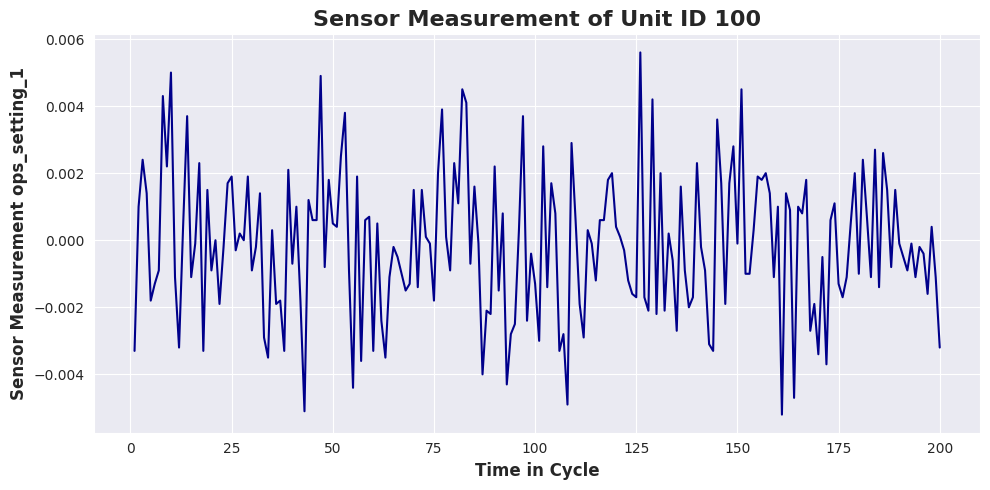

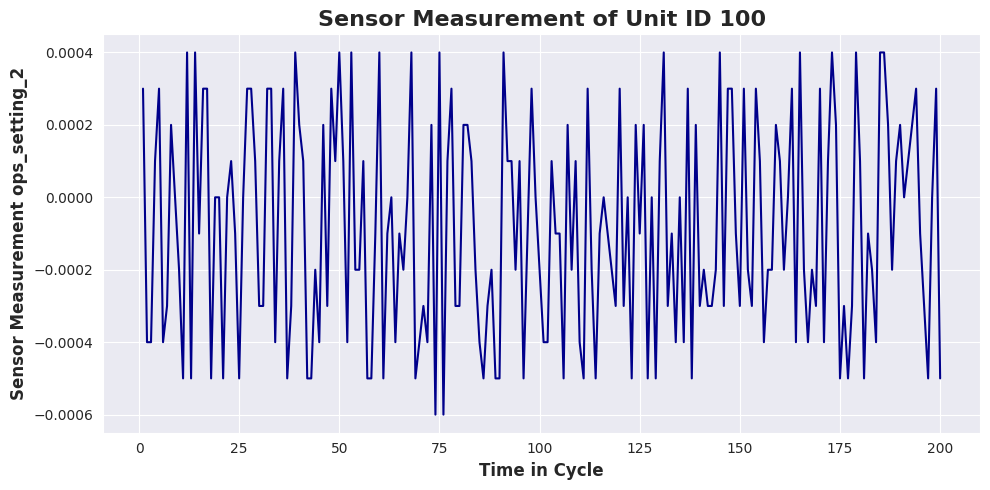

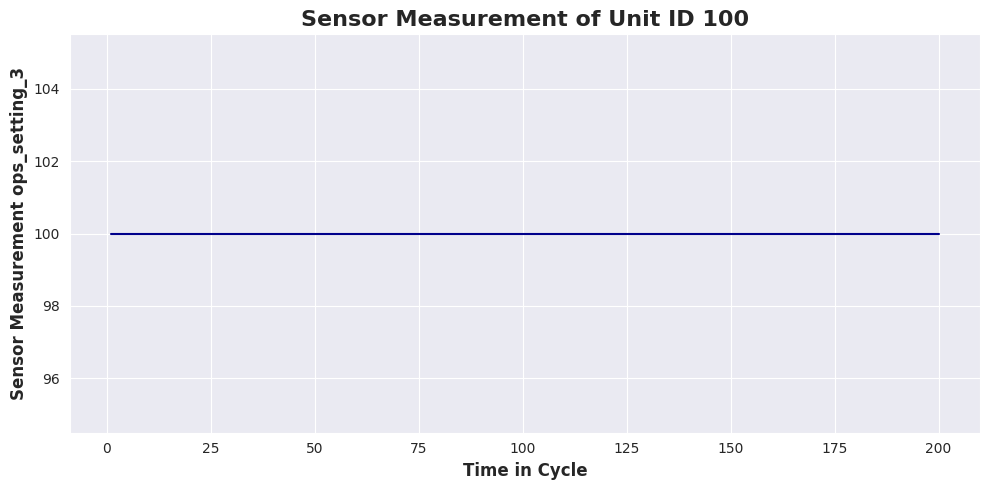

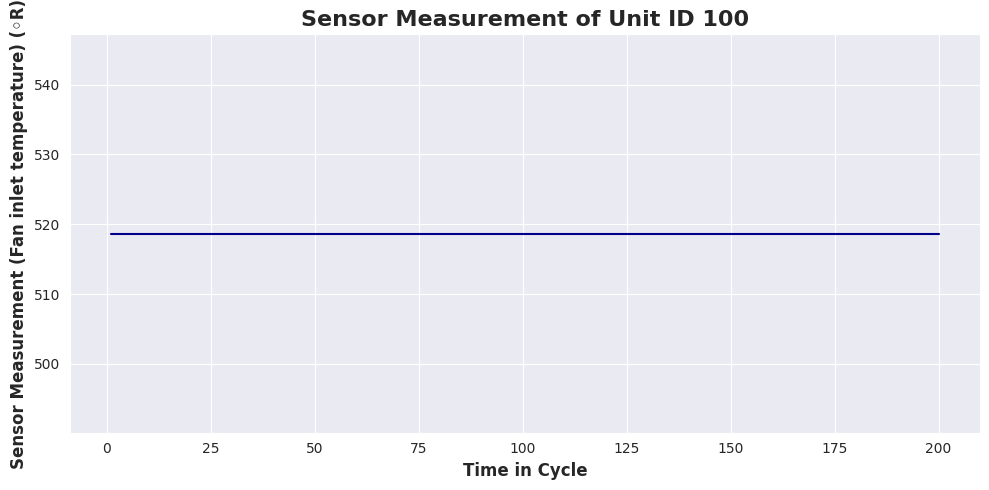

...

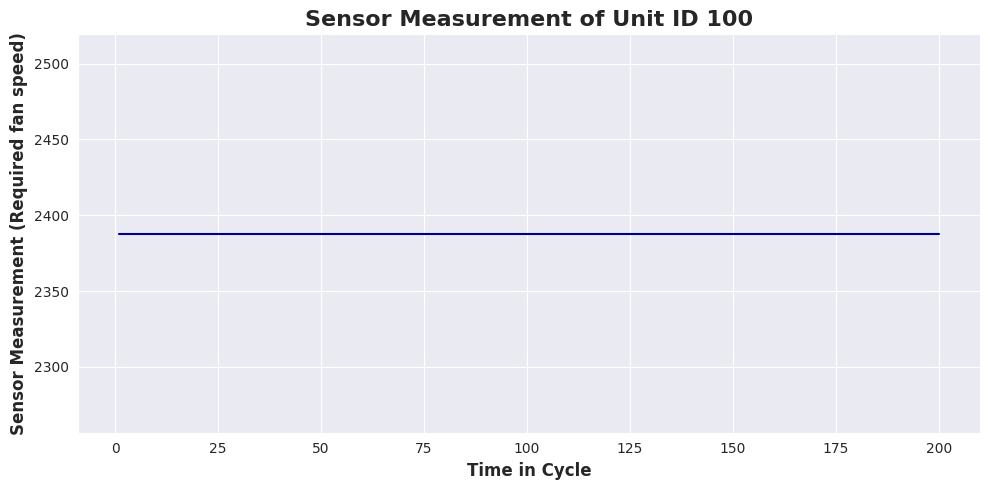

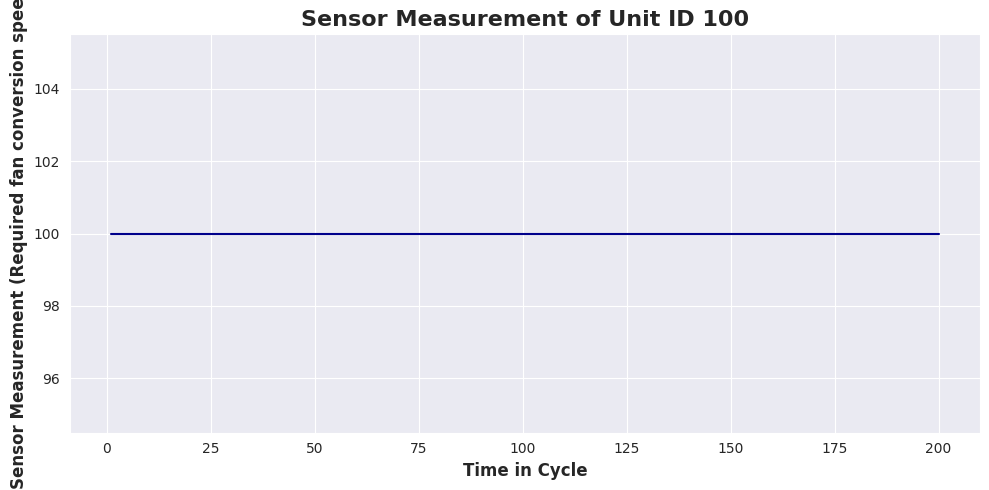

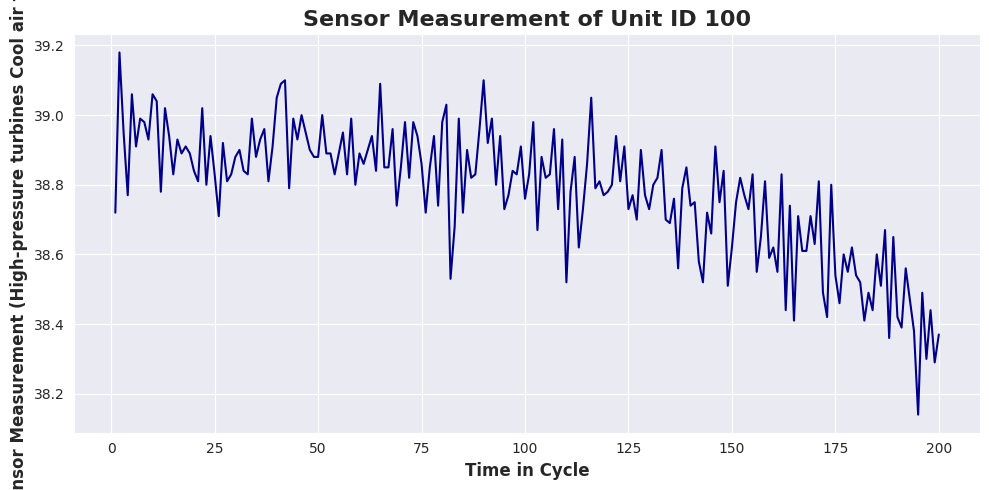

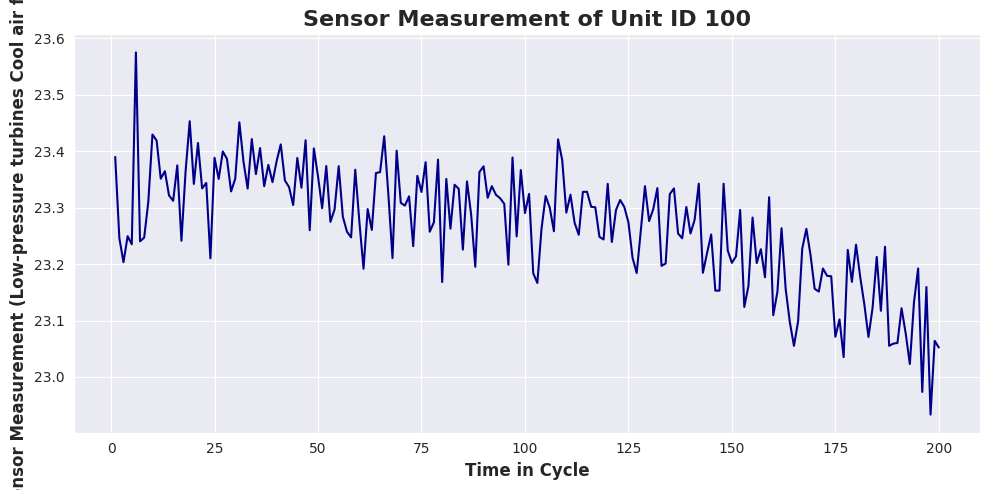

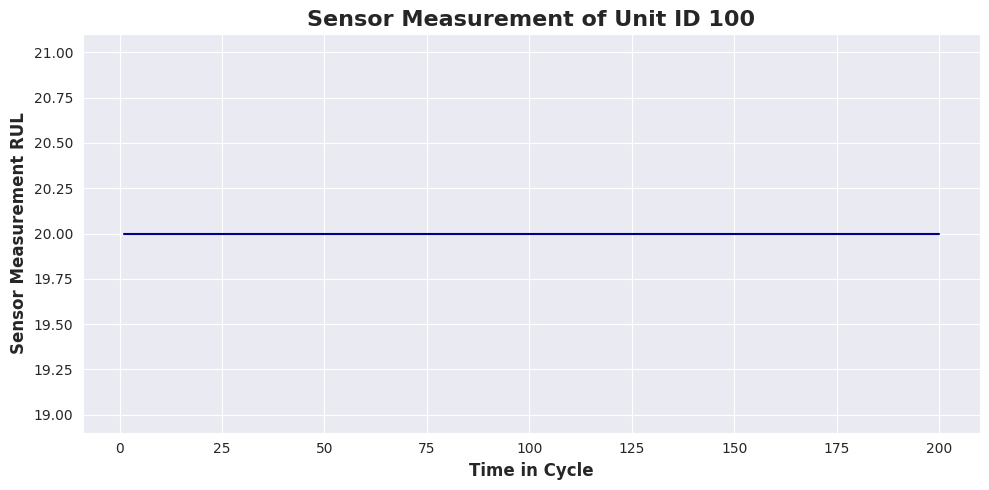

In [41]:
# Lets check another unit number
plot_unit_sensors(data=FD001,
                  unit_id=100,
                  line_color='darkblue')

## 5.4 Sensor's Distribution <a id=5.4></a>

In [42]:
def hist(data,
        fig_size=(20, 22),
        bins=30,
        color='darkblue'):
    """
    Plots regression plots for each sensor variable against the Remaining Useful Life (RUL).

    This function generates a grid of scatter plots with regression lines to visualize
    the relationship between each sensor's measurements and the RUL. Each subplot corresponds
    to a sensor variable, with labels provided by the `sensor_dict`.

    Parameters:
    ----------
    data : pandas.DataFrame
        The dataset containing sensor measurements and the `RUL` column.
        Each column represents a sensor variable.
    sensor_dict : dict
        A dictionary where keys correspond to column names of sensors in the `data` DataFrame,
        and values are descriptive names of the sensors for labeling the plots.
    fig_size : tuple, optional (default=(20, 25))
        The size of the figure to be created (width, height).

    Returns:
    -------
    None
        Displays the regression plots in a grid format.

    Notes:
    ------
    - The grid layout is predefined as 7 rows and 3 columns, which suits up to 21 sensors.
    - If the `sensor_dict` contains more than 21 entries, additional plots will be omitted.
    - The regression line is colored red with a linewidth of 2 by default.
    - This visualization is helpful for identifying linear or non-linear relationships between
      sensor variables and RUL.

    Example:
    --------
    >>> regplot(data=FD001_train, sensor_dict=sensor_dictionary)
    """

    rows, cols = 9, 3
    plt.figure(figsize=fig_size)

    for i, name in enumerate(data.columns[1:], 1):
        plt.subplot(rows, cols, i)
        sns.histplot(data=data,
                     x=name,
                    kde=True,
                    bins=bins,
                    color=color)
        plt.title(f"Distribution Of {name}", fontsize=12, fontweight='bold')
        plt.xlabel(name, fontsize=10, fontweight='bold')
        plt.ylabel("Frequency", fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

### FD001

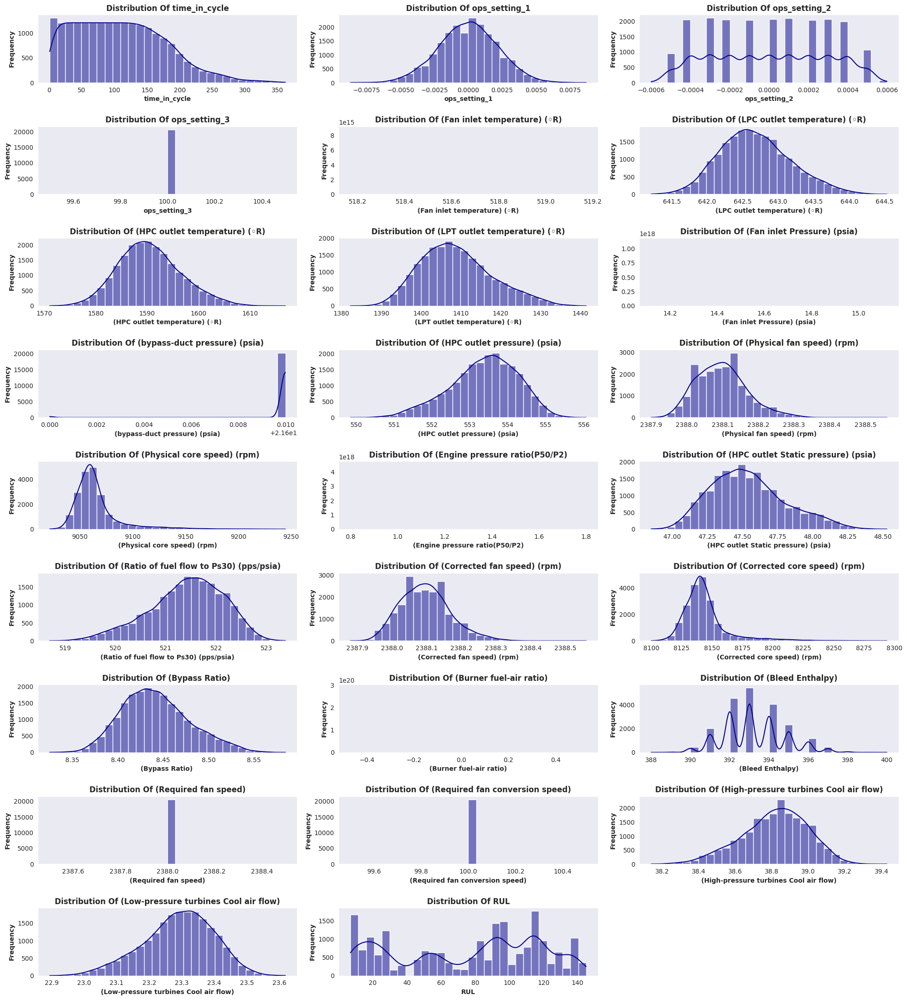

In [43]:
hist(FD001)

### FD003

We can perfome same operation for other dataset as well.

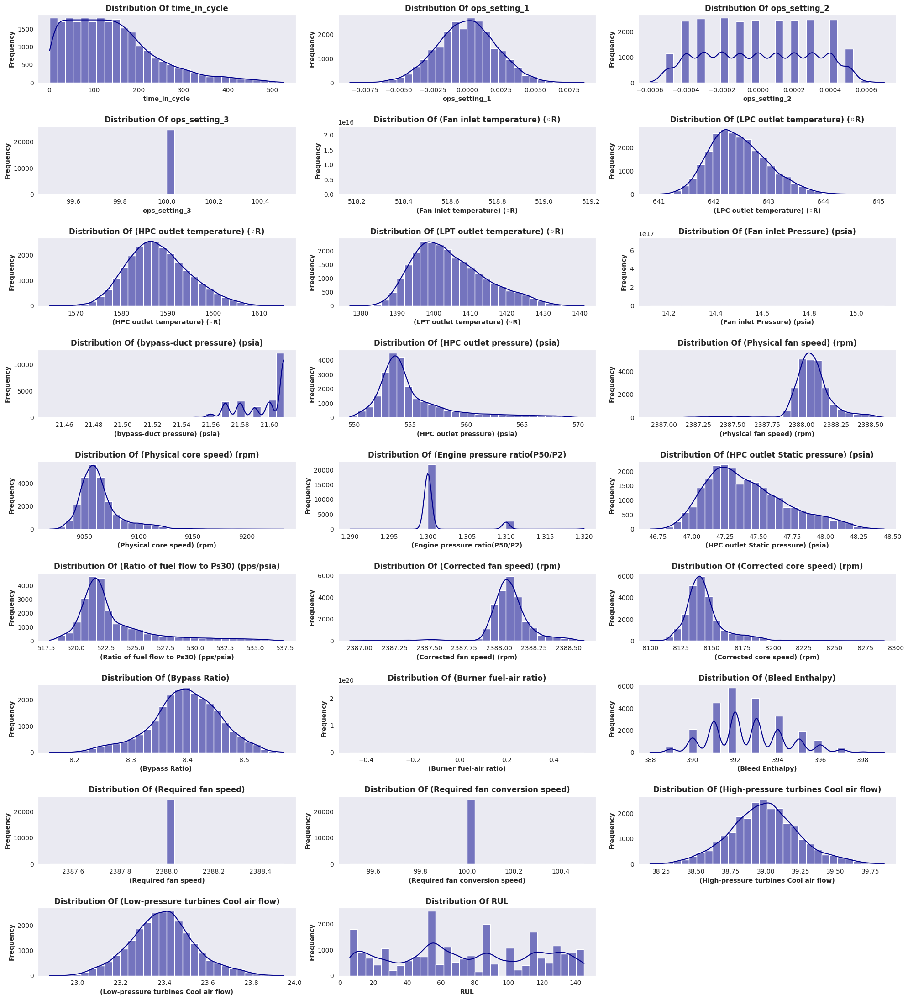

In [44]:
hist(data=FD003)

## 5.5 Boxplot <a id=5.5></a>

In [45]:
def boxplot(data,
            fig_size=(10, 30)):
    """
    Plots boxplots for each sensor variable in the dataset.

    This function generates a grid of boxplots for visualizing the distribution and
    outliers of sensor measurements in the dataset. Each subplot corresponds to a
    sensor variable, with labels provided by the `sensor_dict`.

    Parameters:
    ----------
    data : pandas.DataFrame
        The dataset containing sensor measurements. Each column represents a sensor variable.
    sensor_dict : dict
        A dictionary where keys correspond to column names of sensors in the `data` DataFrame,
        and values are descriptive names of the sensors for labeling the plots.
    fig_size : tuple, optional (default=(15, 30))
        The size of the figure to be created (width, height).

    Returns:
    -------
    None
        Displays the boxplots in a grid format.

    Notes:
    ------
    - The grid layout is predefined as 7 rows and 3 columns, which suits up to 21 sensors.
    - If the `sensor_dict` contains more than 21 entries, additional plots will be omitted.
    - Outliers, if present in the data, will be visualized as individual points on the boxplot.

    Example:
    --------
    >>> boxplot(data=FD001_train, sensor_dict=sensor_dictionary)
    """
    rows, cols = 9, 3
    plt.figure(figsize=fig_size)

    for i, name in enumerate(data.columns[1:], 1):
        plt.subplot(rows, cols, i)
        sns.boxplot(data=data,
                    y=name)
        plt.title(f"{name} Boxplot", fontsize=12, fontweight='bold')
        plt.xlabel(name, fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

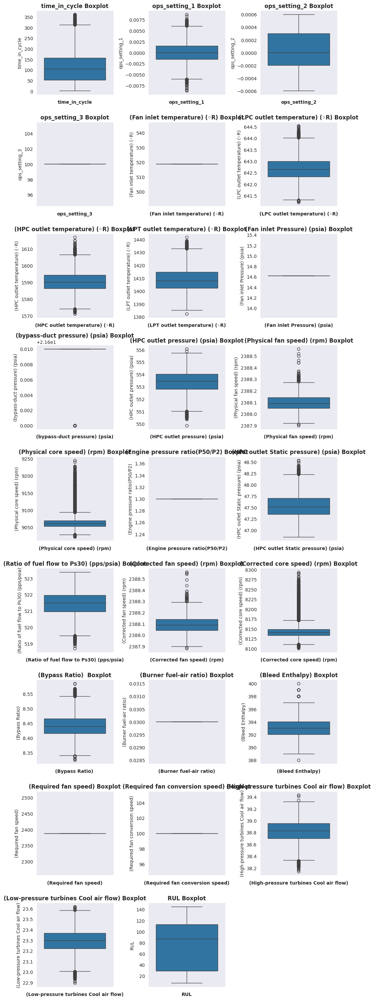

In [46]:
boxplot(data=FD001)

## 5.6 Regplot <a id=5.6></a>

In [47]:
def regplot(data,
            fig_size=(20, 25)):
    """
    Plots boxplots for each sensor variable in the dataset.

    This function generates a grid of boxplots for visualizing the distribution and
    outliers of sensor measurements in the dataset. Each subplot corresponds to a
    sensor variable, with labels provided by the `sensor_dict`.

    Parameters:
    ----------
    data : pandas.DataFrame
        The dataset containing sensor measurements. Each column represents a sensor variable.
    sensor_dict : dict
        A dictionary where keys correspond to column names of sensors in the `data` DataFrame,
        and values are descriptive names of the sensors for labeling the plots.
    fig_size : tuple, optional (default=(15, 30))
        The size of the figure to be created (width, height).

    Returns:
    -------
    None
        Displays the boxplots in a grid format.

    Notes:
    ------
    - The grid layout is predefined as 7 rows and 3 columns, which suits up to 21 sensors.
    - If the `sensor_dict` contains more than 21 entries, additional plots will be omitted.
    - Outliers, if present in the data, will be visualized as individual points on the boxplot.

    Example:
    --------
    >>> boxplot(data=FD001_train, sensor_dict=sensor_dictionary)
    """
    rows, cols = 9, 3
    plt.figure(figsize=fig_size)

    for i, name in enumerate(data.columns[1:], 1):
        plt.subplot(rows, cols, i)
        sns.regplot(data=data,
                    x='RUL',
                    y=name,
                    line_kws={'color': 'red', 'linewidth': 2})
        plt.title(f"{name} Vs RUL", fontsize=12, fontweight='bold')
        plt.xlabel('RUL', fontsize=10, fontweight='bold')
        plt.ylabel(name, fontsize=10, fontweight='bold')
    plt.tight_layout()
    plt.show()

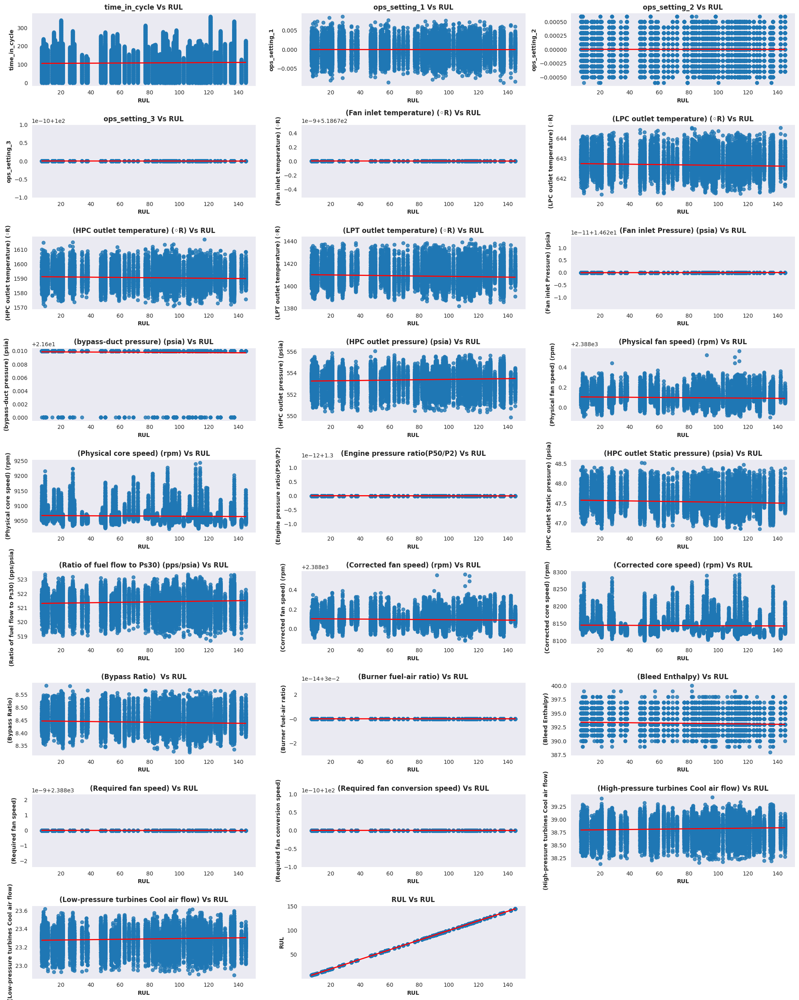

In [48]:
regplot(data=FD001)

### 5.6.1 Analysis Of regplot <a id=5.6.1></a>
* Most variables do not exhibit a clear linear relationship with the Remaining Useful Life (RUL).
* The red regression lines are almost flat in most cases, indicating a weak or no correlation between the sensor values and the RUL.
* Some variables might contain a significant amount of noise, obscuring their relationship with RUL.



## 5.7 Rolling Mean (Smoothing Plot) <a id=5.7></a>

In [173]:
def smoothing_plot(data,
                   fig_size=(10, 5),
                   from_unit=0,
                   to_unit=5):
    """
    Plots smoothed sensor data over time for different units.

    This function takes sensor data and applies a rolling mean smoothing technique
    to the data for each unit, plotting the smoothed values over time in a figure.
    The function handles multiple sensors and allows customization of the number of
    units and figure size.

    Parameters:
    - data (pandas.DataFrame): The dataset containing sensor data.
    - sensor_dict (dict): A dictionary where keys are sensor names and values are
                          the names to display in the plot's title.
    - fig_size (tuple): The size of the figure (default is (10, 5)).
    - n_unit (int): The number of units to plot (default is 5). Only the first `n_unit`
                    units will be plotted.

    Returns:
    - None: This function directly plots the figures for each sensor.

    Example:
    - smoothing_plot(FD001, {'sensor1': 'Sensor 1', 'sensor2': 'Sensor 2'})
    """
    for name in data.columns[1:]:
        plt.figure(figsize=fig_size)
        for unit in FD001['unit_number'].unique()[from_unit:to_unit]:
            subset = FD001[FD001['unit_number'] == unit]
            plt.plot(subset['time_in_cycle'], subset[name].rolling(window=10).mean(), label=f"Unit {unit}")
        plt.title(f"Smoothed {name} vs Time in Cycle")
        plt.xlabel("Time in Cycle")
        plt.ylabel(name)
        plt.legend()
        plt.show()

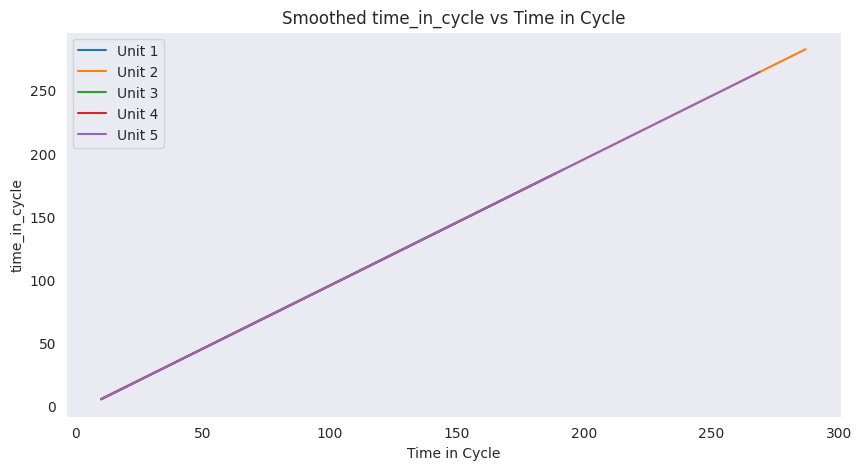

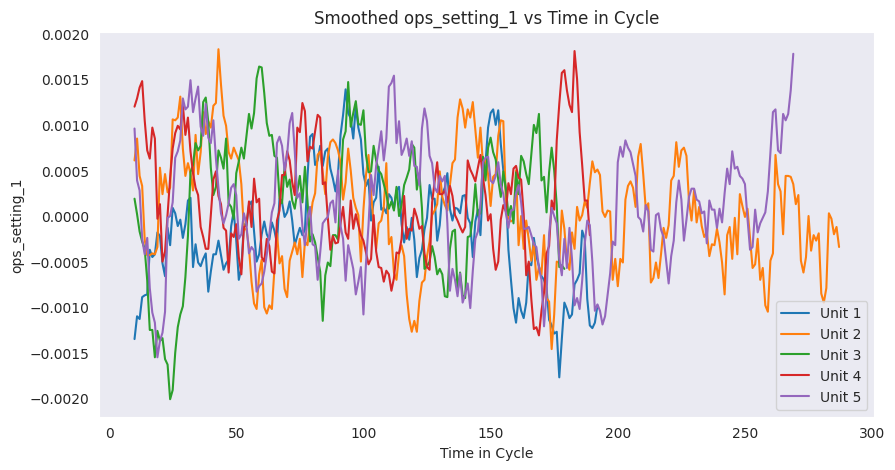

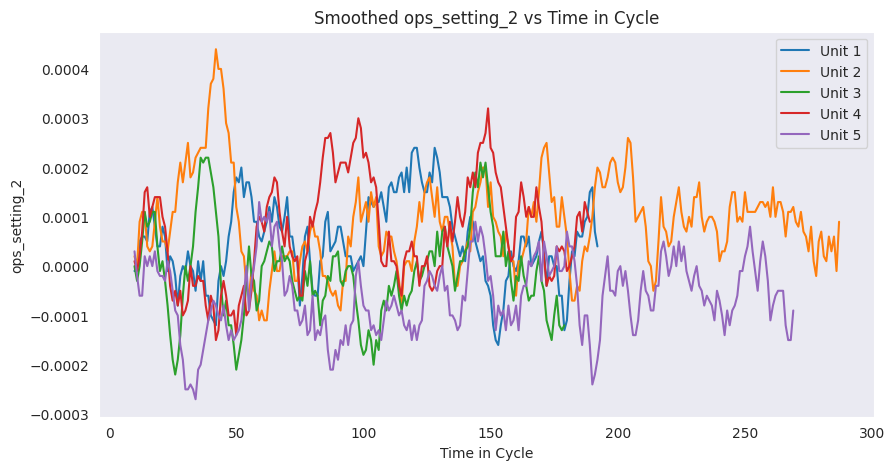

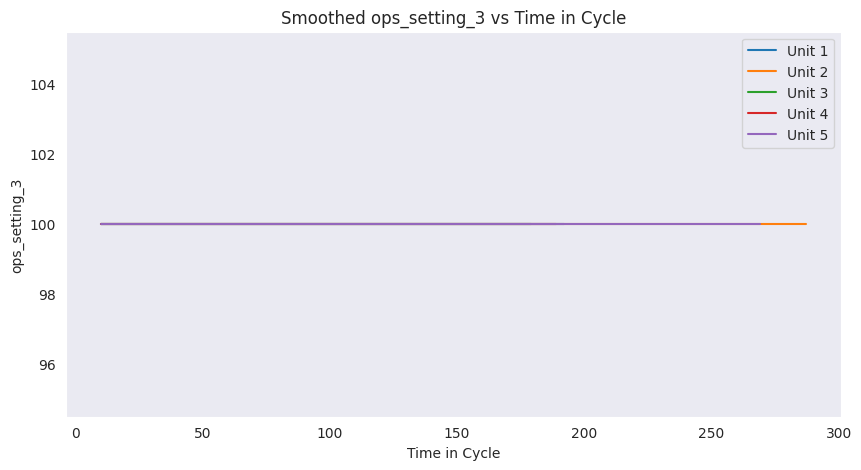

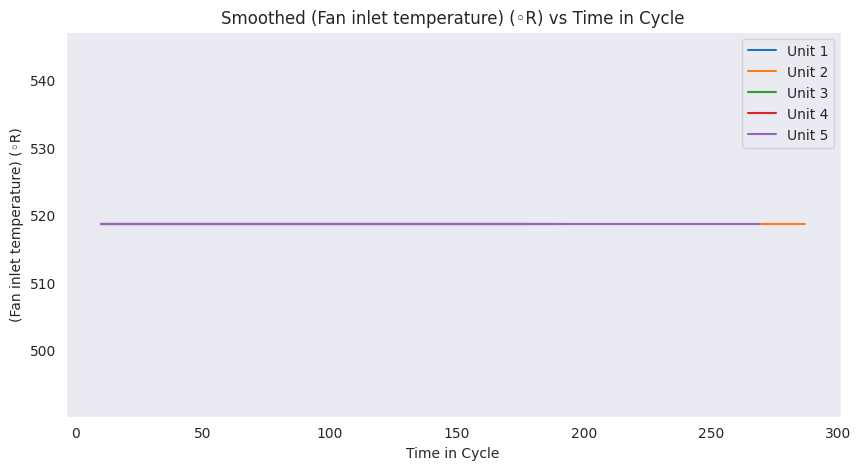

...

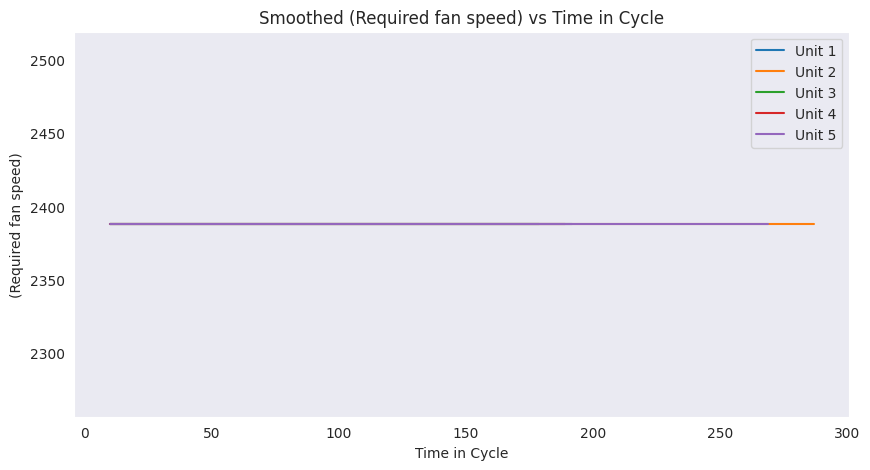

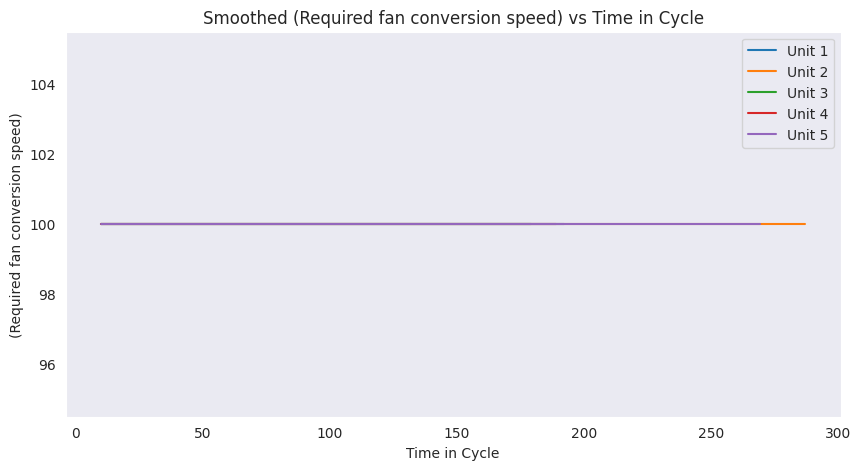

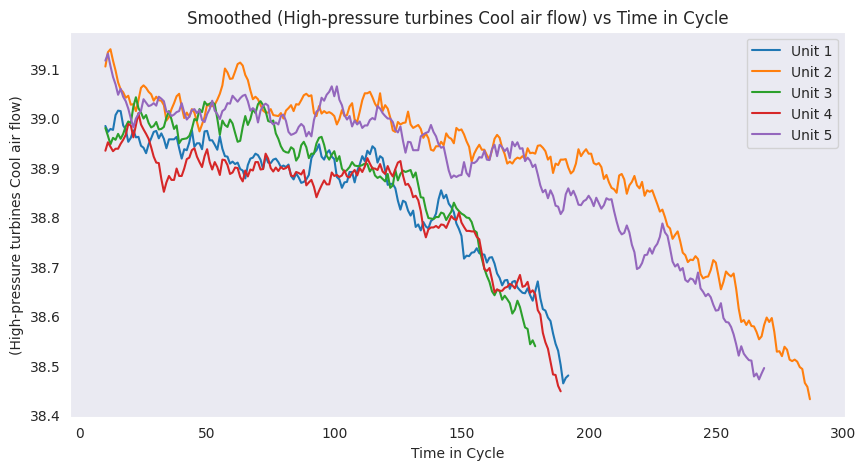

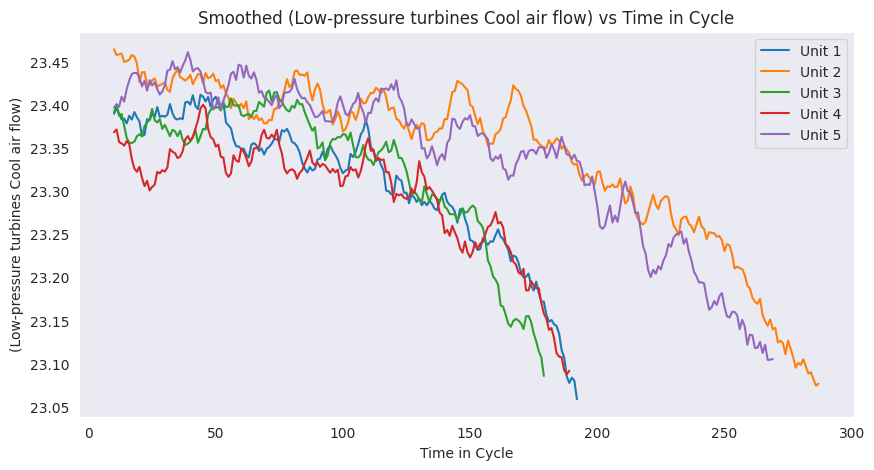

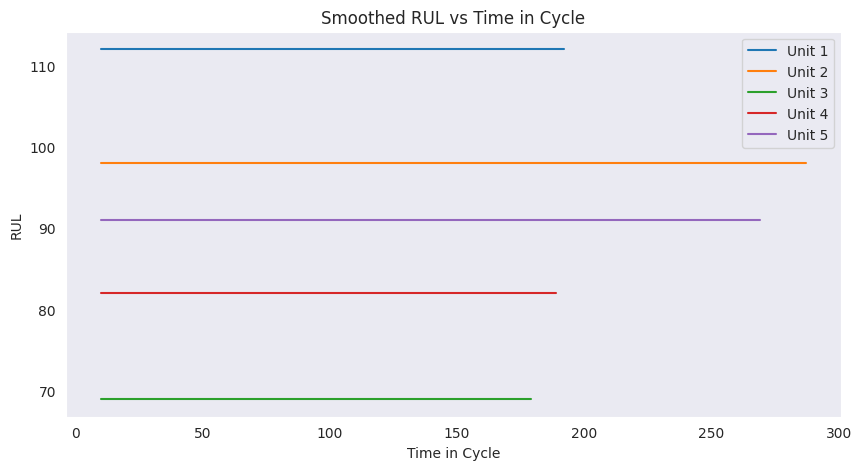

In [174]:
smoothing_plot(FD001)

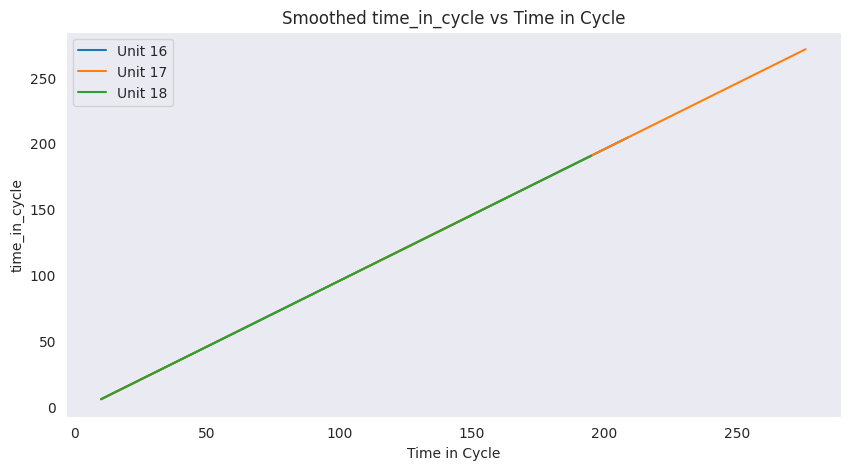

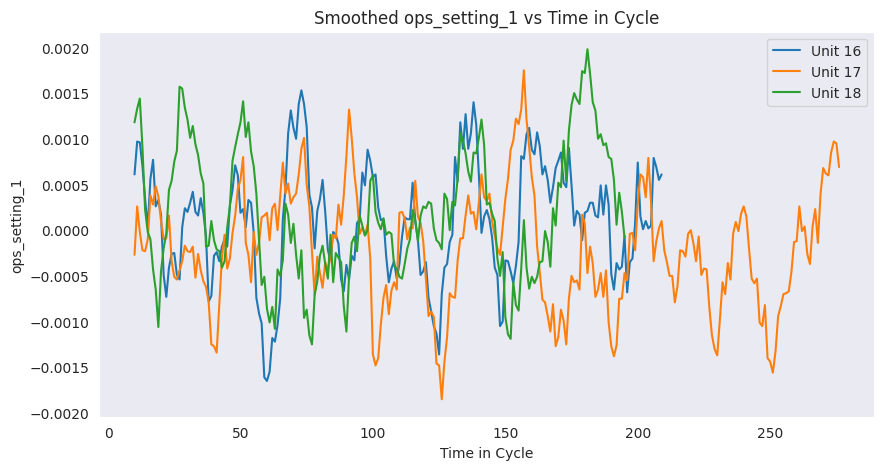

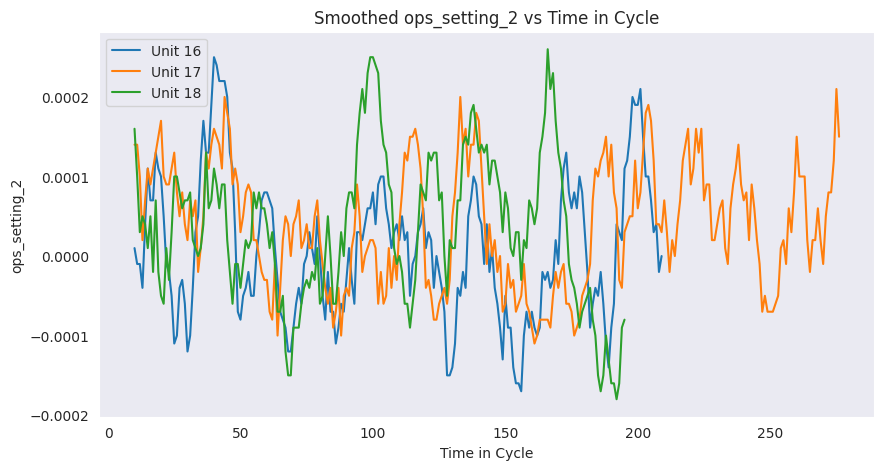

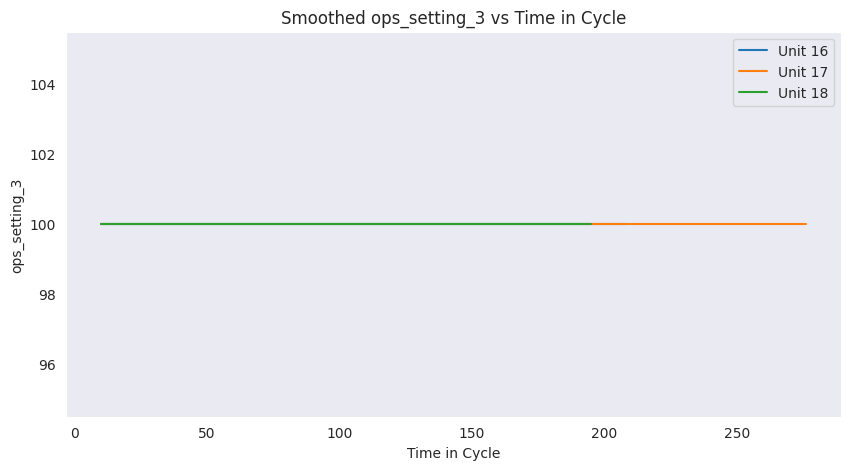

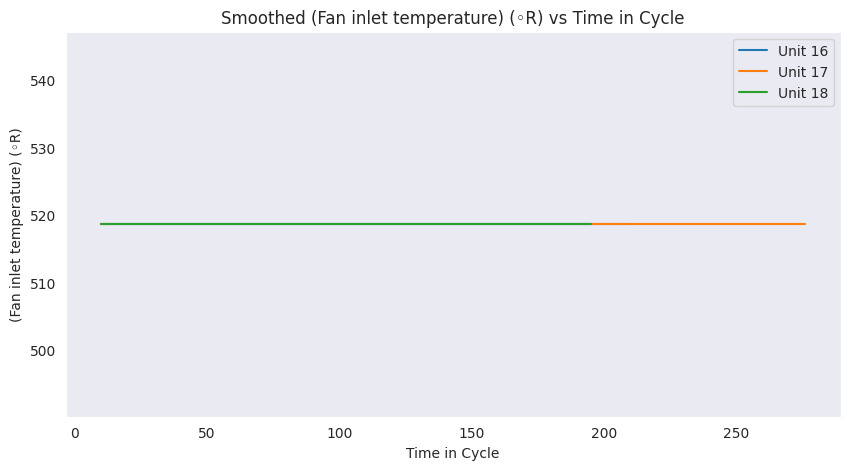

...

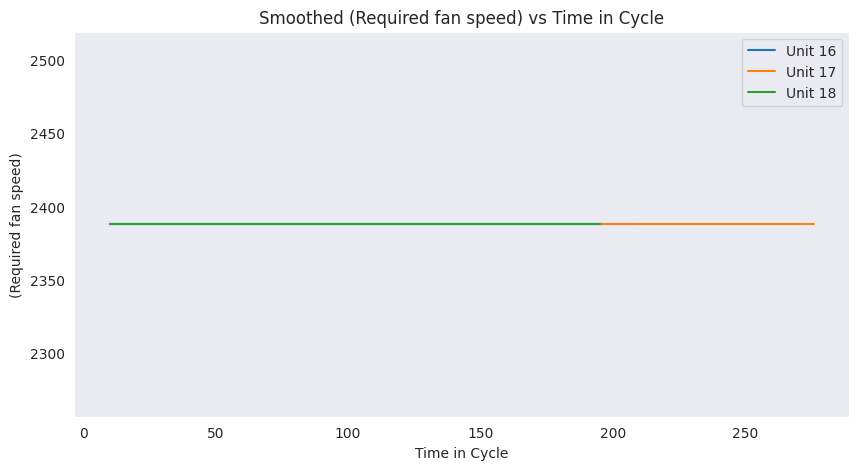

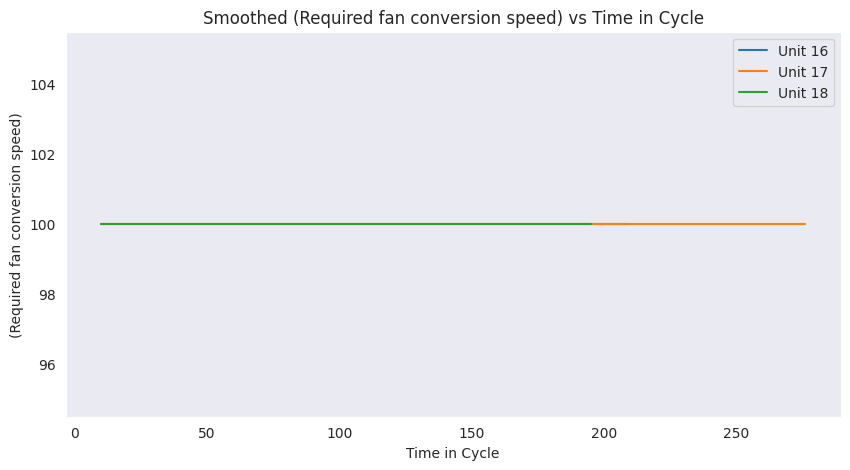

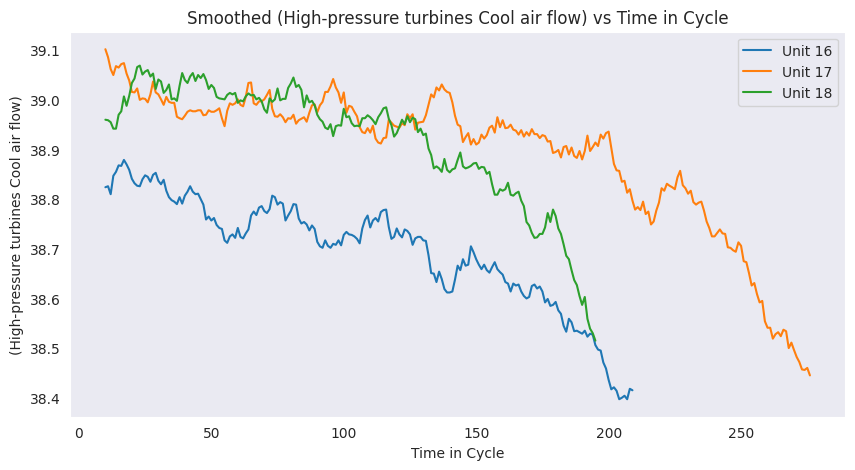

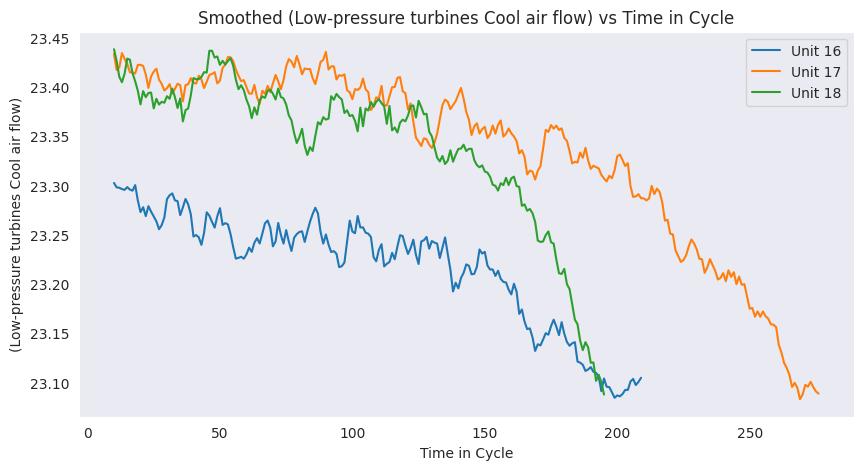

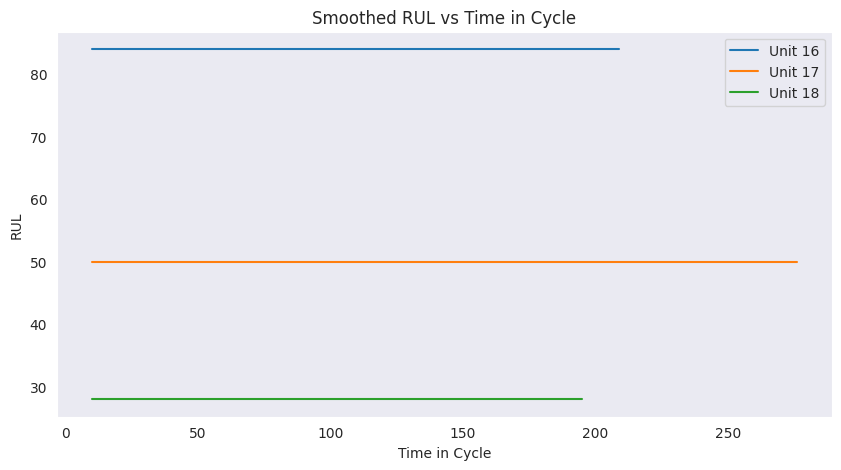

In [175]:
smoothing_plot(FD001, from_unit=15, to_unit=18)

## 5.8 Compute Rolling Aggregated Metrics <a id=5.8></a>

In [176]:
def compute_rolling_features(df, sensor_cols, window_size=5):
    """
    Computes rolling mean and standard deviation for specified sensor columns
    in the dataframe, grouped by 'unit_number'.

    Parameters:
    ----------
    df : pandas.DataFrame
        The input dataframe containing sensor data and 'unit_number'.
    sensor_cols : list
        List of column names corresponding to sensor data for which rolling
        features will be computed.
    window_size : int, optional (default=5)
        The size of the rolling window over which metrics are computed.

    Returns:
    -------
    pandas.DataFrame
        A dataframe with new columns added for rolling mean and standard deviation
        for each sensor column in `sensor_cols`. The new column names are of the
        format `<sensor>_roll_mean` and `<sensor>_roll_std`.

    Example:
    --------
    sensors = ['sensor_1', 'sensor_2']
    df = compute_rolling_features(df, sensors, window_size=3)
    """
    for sensor in sensor_cols:
        df[f"{sensor}_roll_mean"] = df.groupby("unit_number")[sensor].rolling(window=window_size).mean().reset_index(drop=True)
        df[f"{sensor}_roll_std"] = df.groupby("unit_number")[sensor].rolling(window=window_size).std().reset_index(drop=True)
    return df

In [177]:
FD001_statistical_info = compute_rolling_features(FD001, dict_list)

In [178]:
def plot_rolling_features(data,
                        unit_id,
                        sensor,
                        figsize=(10, 5)):
    """
    Visualizes raw sensor data and its rolling metrics (mean and standard deviation)
    for a single unit from the dataset.

    Parameters:
    ----------
    data : pandas.DataFrame
        The dataframe containing sensor data and precomputed rolling features.
    unit_id : int
        The ID of the unit to visualize.
    sensor : str
        The column name of the sensor to plot.
    figsize : tuple, optional (default=(10, 5))
        Figure size for the plot.

    Returns:
    -------
    None
        Displays a plot of the raw sensor data, rolling mean, and rolling standard
        deviation for the specified unit and sensor.

    Example:
    --------
    single_unit_rolling(data=df, unit_id=1, sensor="sensor_1")
    """
    unit_data = data[data["unit_number"] == unit_id]
    plt.figure(figsize=(12, 6))
    plt.plot(unit_data["time_in_cycle"], unit_data[sensor], label="Raw Sensor Data")
    plt.plot(unit_data["time_in_cycle"], unit_data[f"{sensor}_roll_mean"], label="Rolling Mean")
    plt.fill_between(
        unit_data["time_in_cycle"],
        unit_data[f"{sensor}_roll_mean"] - unit_data[f"{sensor}_roll_std"],
        unit_data[f"{sensor}_roll_mean"] + unit_data[f"{sensor}_roll_std"],
        color='gray', alpha=0.3, label="Rolling Std Dev"
    )
    plt.xlabel("Time in Cycle")
    plt.ylabel(sensor)
    plt.title(f"Rolling Metrics for Unit {unit_id}")
    plt.legend()
    plt.show()

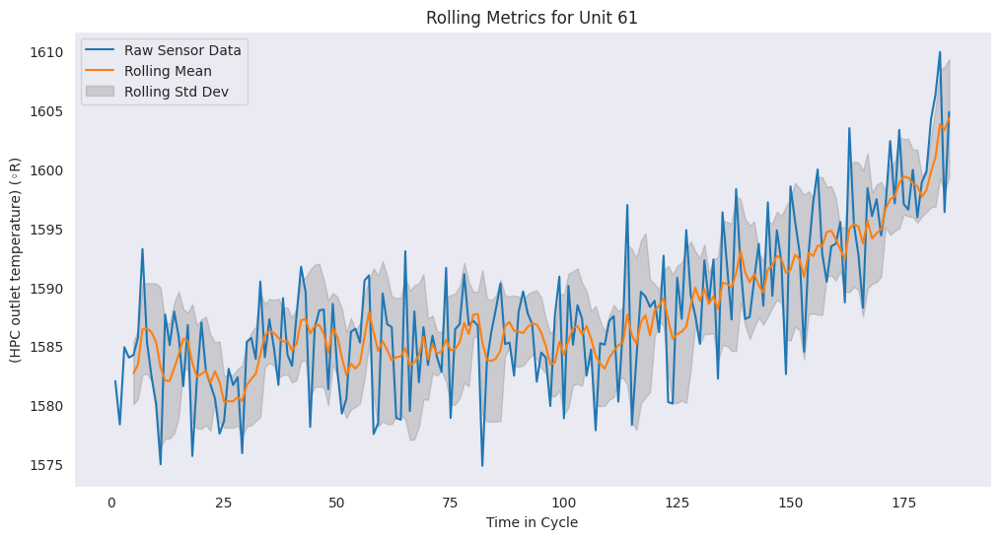

In [179]:
plot_rolling_features(FD001_statistical_info, 61, "(HPC outlet temperature) (◦R)")

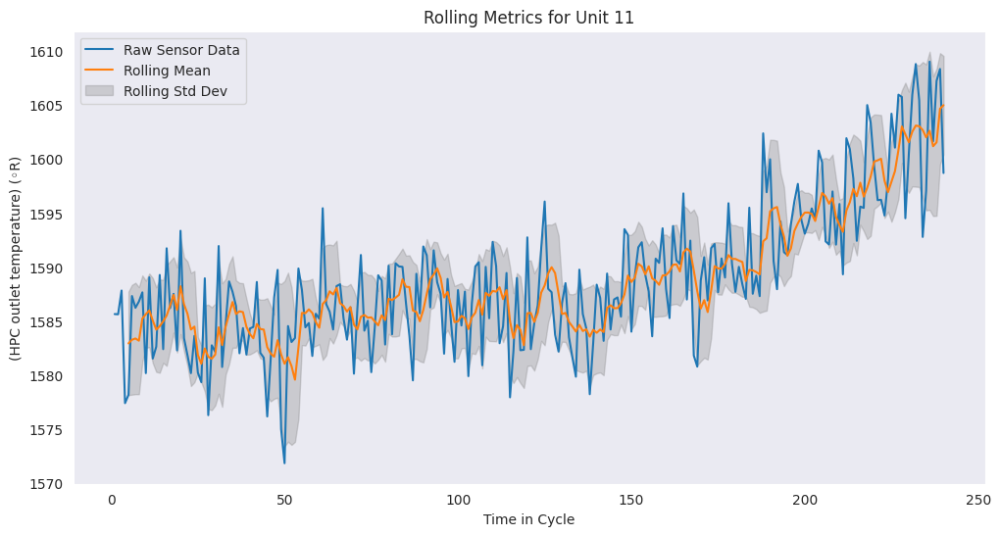

In [180]:
plot_rolling_features(FD001_statistical_info, 11, "(HPC outlet temperature) (◦R)")

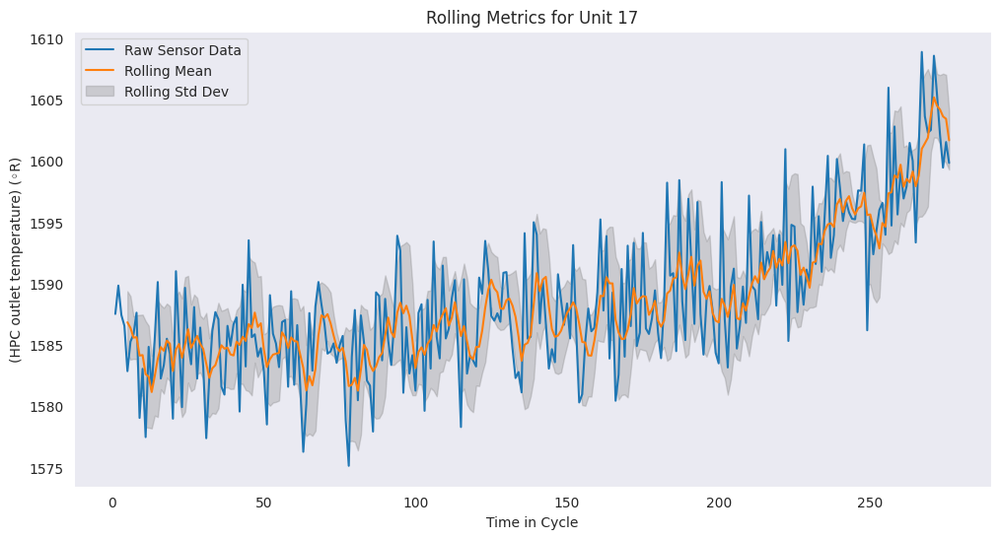

In [181]:
plot_rolling_features(FD001_statistical_info, 17, "(HPC outlet temperature) (◦R)")

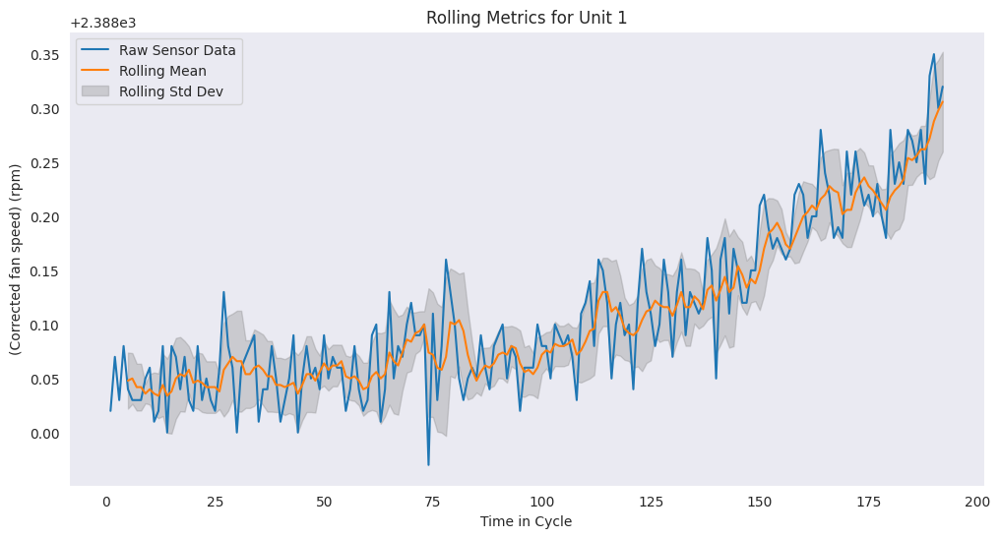

In [182]:
plot_rolling_features(FD001_statistical_info, 1, "(Corrected fan speed) (rpm)")

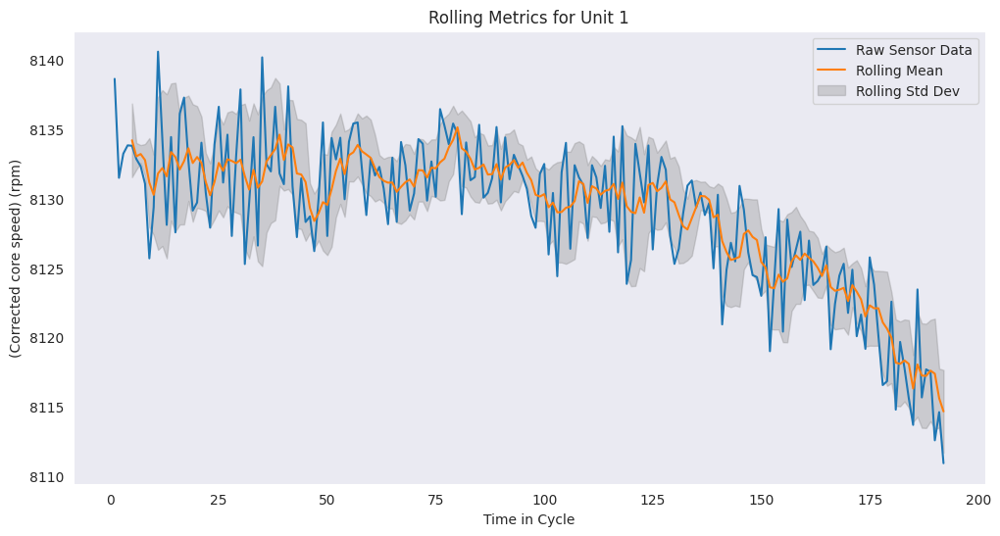

In [183]:
plot_rolling_features(FD001_statistical_info, 1, "(Corrected core speed) (rpm)")

## 5.9 Clustering Based on Operational Settings <a id=5.9></a>

In [184]:
operations_settings = ['ops_setting_1', 'ops_setting_2', 'ops_setting_3']

In [185]:
def add_operational_clusters(data,
                             ops_cols,
                             n_clusters=3):
    """
    Adds operational condition clusters to the dataset based on specified columns.

    This function applies K-Means clustering on scaled operational setting columns
    to group similar operational conditions into distinct clusters. The resulting
    cluster labels are added as a new column (`operational_cluster`) in the dataset.

    Parameters:
    ----------
    df : pd.DataFrame
        The input DataFrame containing operational data.
    ops_cols : list of str
        List of column names representing the operational settings to be used for clustering.
    n_clusters : int, optional, default=3
        The number of clusters to form.

    Returns:
    -------
    pd.DataFrame
        The input DataFrame with an additional column `operational_cluster` indicating
        the cluster assignments for each data point.

    Example:
    -------
    >>> ops_columns = ["ops_setting_1", "ops_setting_2", "ops_setting_3"]
    >>> df = add_operational_clusters(df, ops_columns, n_clusters=3)
    >>> print(df["operational_cluster"].unique())
    [0, 1, 2]
    """
    scaler = StandardScaler()
    ops_data_scaled = scaler.fit_transform(data[ops_cols])

    # Clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(ops_data_scaled)

    data["operational_cluster"] = clusters
    return data

In [186]:
FD001_statistical_info = add_operational_clusters(FD001_statistical_info, operations_settings)

In [187]:
def plot_operational_clusters(df):
    """
    This function plots a scatter plot of two operational settings (ops_setting_1 and ops_setting_2)
    from the given dataframe and colors the points according to the operational clusters
    identified in the 'operational_cluster' column.

    The plot helps visualize how the data points are distributed across different operational clusters,
    providing insights into the relationship between operational settings and cluster membership.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input dataframe containing the operational settings (ops_setting_1, ops_setting_2, etc.)
        and the 'operational_cluster' column indicating the cluster assignments.

    Returns:
    --------
    None
        Displays the scatter plot showing the relationship between the selected operational settings
        and the operational clusters.
    """
    # Create a scatter plot with different colors for each operational cluster
    plt.figure(figsize=(8, 4))

    # Scatter plot of two operational settings, color-coded by the operational cluster
    sns.scatterplot(data=df, x='ops_setting_1', y='ops_setting_2', hue='operational_cluster', palette='Set1', marker='o')

    # Adding labels and title
    plt.xlabel('Operational Setting 1')
    plt.ylabel('Operational Setting 2')
    plt.title('Operational Clusters Based on Settings')

    # Show the plot
    plt.legend(title='Cluster', loc='upper right')
    plt.show()

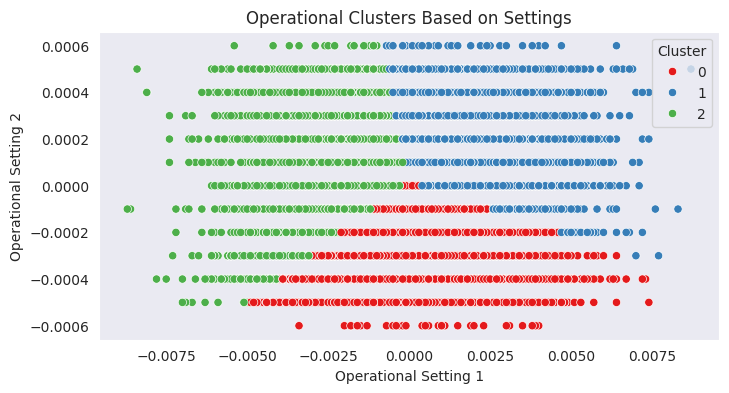

In [188]:
plot_operational_clusters(FD001_statistical_info)

In [189]:
def assess_clusters_on_rul(df):
    """
    This function assesses how operational clusters (from the 'operational_cluster' column)
    affect the Remaining Useful Life (RUL) by grouping the data by clusters and visualizing
    the distribution of RUL within each cluster.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input dataframe containing the 'operational_cluster' and 'RUL' columns.

    Returns:
    --------
    None
        Displays summary statistics and a box plot for RUL by operational cluster.
    """

    # 1. Compute summary statistics of RUL for each operational cluster
    cluster_stats = df.groupby("operational_cluster")["RUL"].describe()
    print(cluster_stats)

    # 2. Plot a box plot of RUL distribution for each operational cluster
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x="operational_cluster", y="RUL", palette='Set1')
    plt.title('RUL Distribution by Operational Cluster')
    plt.xlabel('Operational Cluster')
    plt.ylabel('Remaining Useful Life (RUL)')
    plt.show()

    # 3. Correlation between operational clusters and RUL
    correlation = df[["operational_cluster", "RUL"]].corr()
    print("\nCorrelation between Operational Cluster and RUL:")
    print(correlation)

                      count       mean        std  min   25%   50%    75%  \
operational_cluster                                                         
0                    7910.0  75.758154  41.715242  7.0  29.0  87.0  113.0   
1                    6542.0  75.481046  42.186178  7.0  29.0  85.0  113.0   
2                    6179.0  76.270432  41.994868  7.0  34.0  87.0  113.0   

                       max  
operational_cluster         
0                    145.0  
1                    145.0  
2                    145.0  


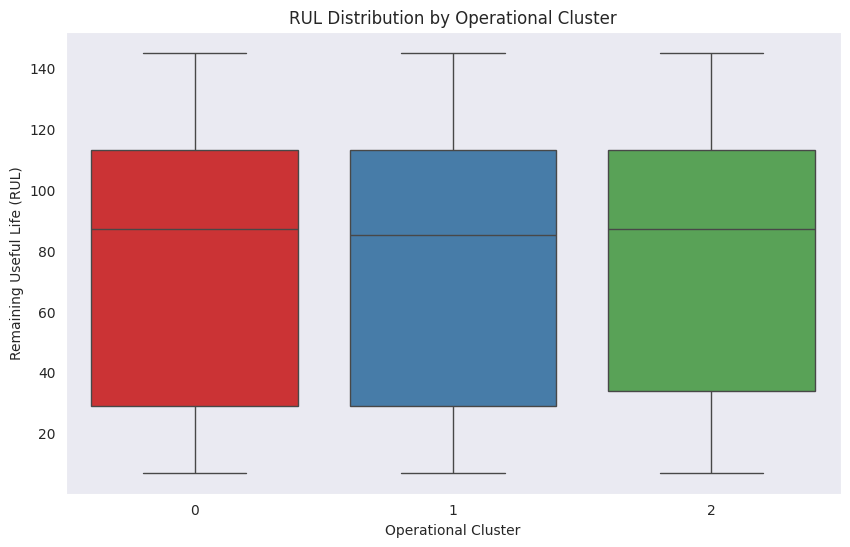


Correlation between Operational Cluster and RUL:
                     operational_cluster       RUL
operational_cluster             1.000000  0.004609
RUL                             0.004609  1.000000


In [190]:
assess_clusters_on_rul(FD001_statistical_info)

## 5.10 Correlation Matrix <a id=5.10></a>

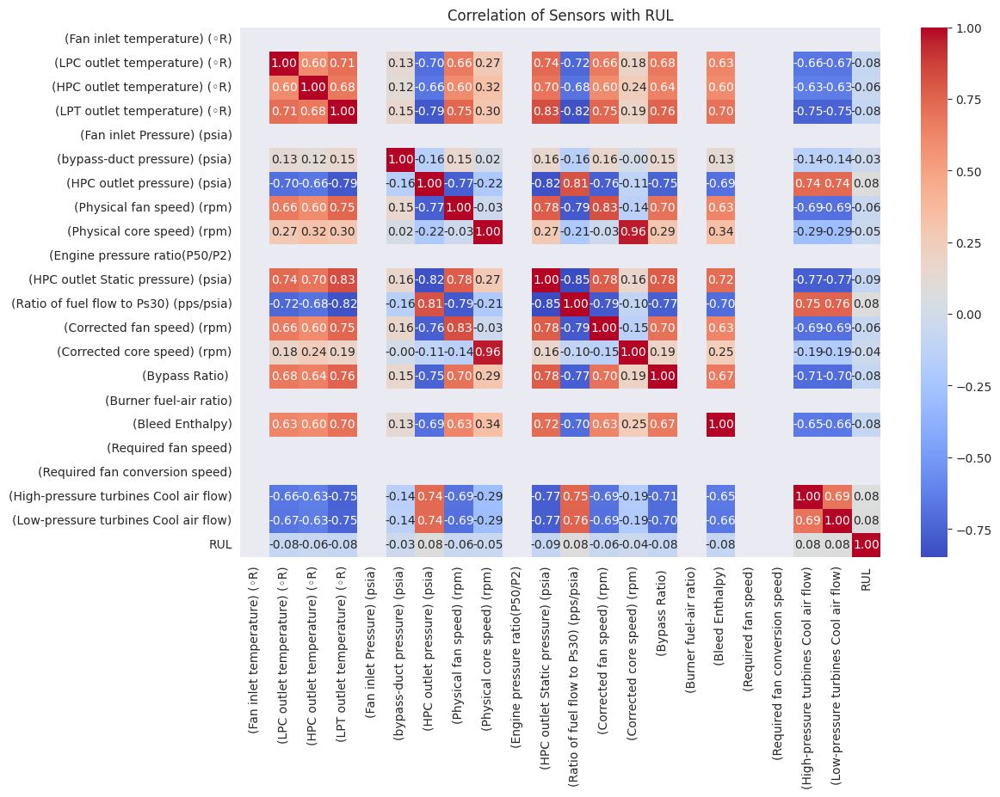

In [191]:
correlation_matrix = FD001[dict_list + ['RUL']].corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation of Sensors with RUL')
plt.show()

# 6. Anomaly Detection In Sensor Behavior <a id=6></a>

In [201]:
def detect_sensor_anomalies(data,
                            sensor_cols,
                            figsize=(8, 5),
                            standardize=False,
                            contamination=0.05):
    """
    Detects anomalies in sensor data using the Isolation Forest algorithm and visualizes the results.

    Parameters:
    - data (DataFrame): The input DataFrame containing sensor data.
    - sensor_cols (list): A list of sensor columns to be analyzed for anomalies.
    - figsize (tuple): The size of the plot for visualization. Default is (16, 10).
    - contamination (float): The proportion of data points expected to be anomalies. Default is 0.05 (5%).

    Returns:
    - data (DataFrame): The original DataFrame with a new 'anomaly' column indicating detected anomalies.
    """

    # Train Isolation Forest to detect anomalies
    iso_forest = IsolationForest(contamination=contamination, random_state=42)

    if standardize:
        standard_scaler = StandardScaler()
        data[sensor_cols] = standard_scaler.fit_transform(data[sensor_cols])

    # Fit the model and predict anomalies for each sensor
    for sensor in sensor_cols:
        anomalies = iso_forest.fit_predict(data[[sensor]])

        # -1 indicates anomalies, 1 indicates normal data
        data[f'anomaly_{sensor}'] = anomalies

        # Plot the anomalies for the current sensor
        plt.figure(figsize=figsize)
        plt.plot(data['time_in_cycle'], data[sensor], label=f'{sensor} Sensor Data')
        plt.scatter(data['time_in_cycle'][data[f'anomaly_{sensor}'] == -1],
                    data[sensor][data[f'anomaly_{sensor}'] == -1],
                    color='red', label='Anomalies')
        plt.xlabel('Time in Cycle')
        plt.ylabel(f'{sensor} Sensor Value')
        plt.legend()
        plt.title(f'Anomaly Detection with Isolation Forest - {sensor}')
        plt.show()

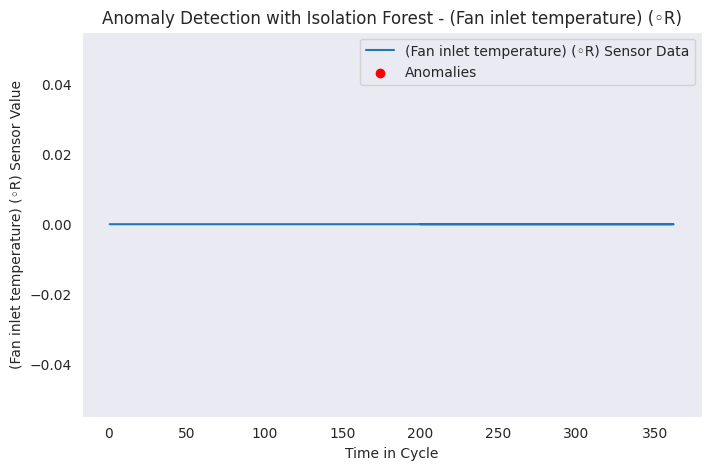

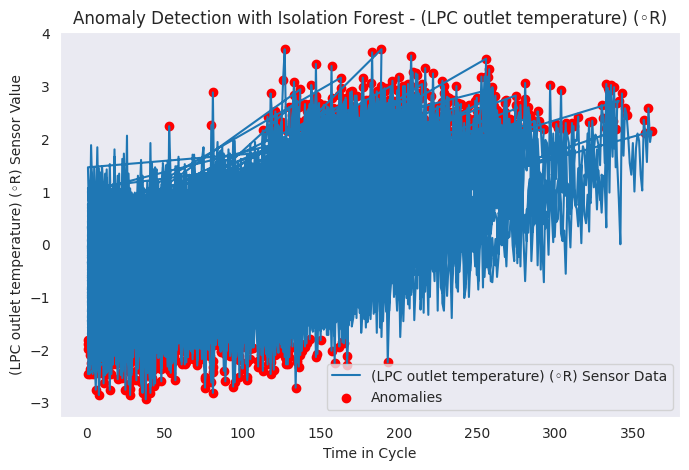

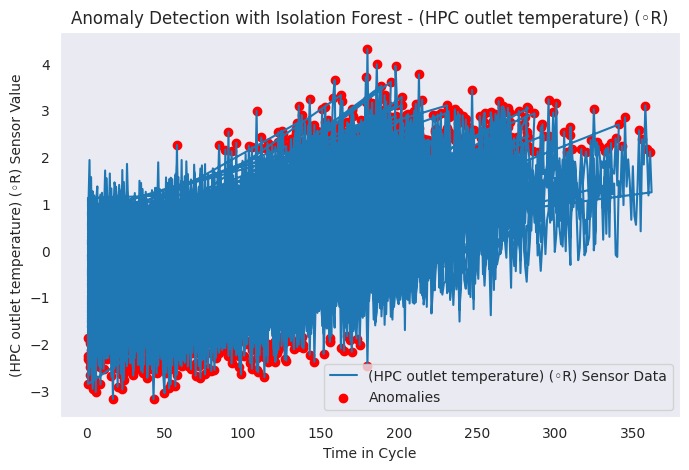

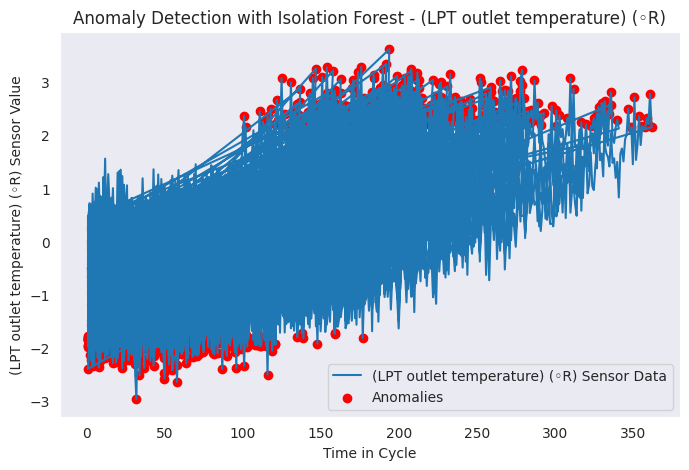

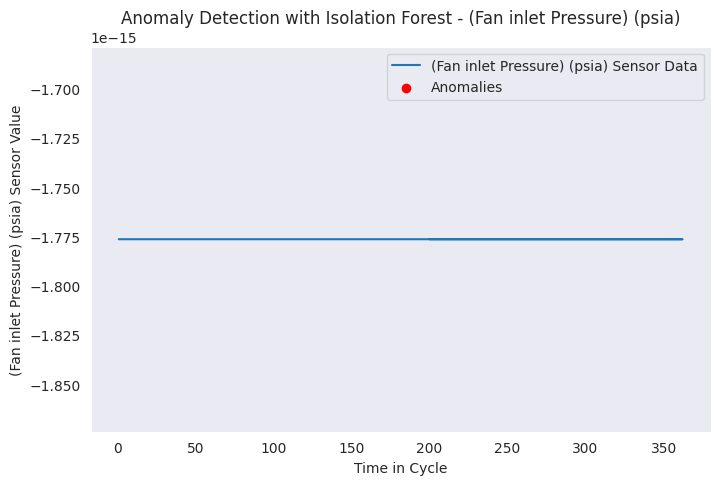

...

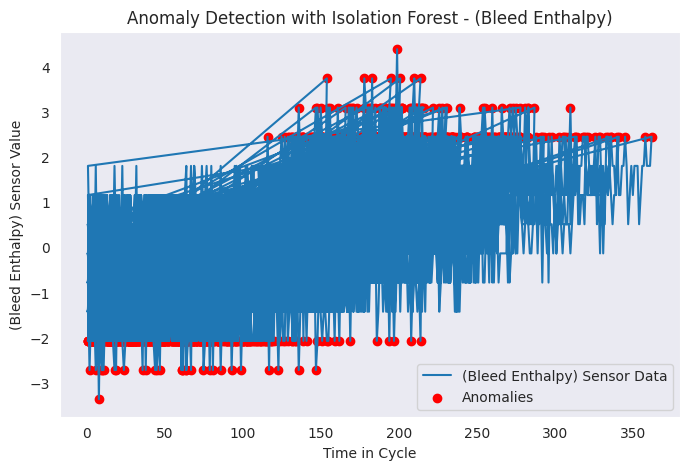

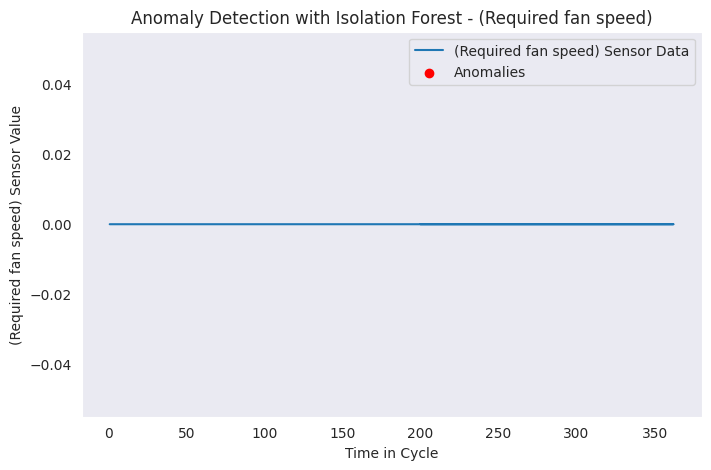

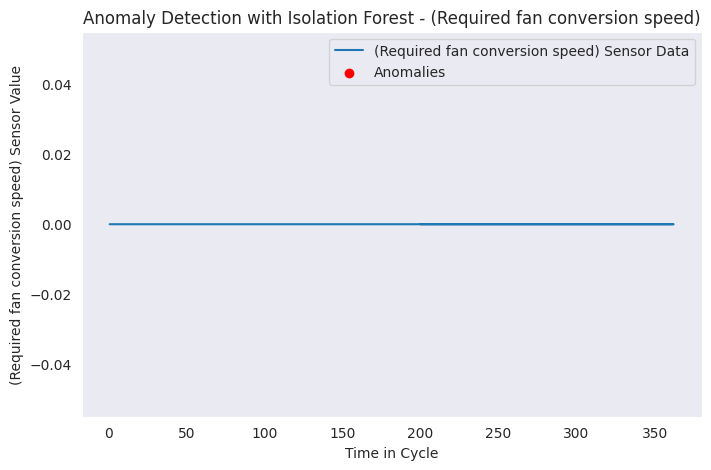

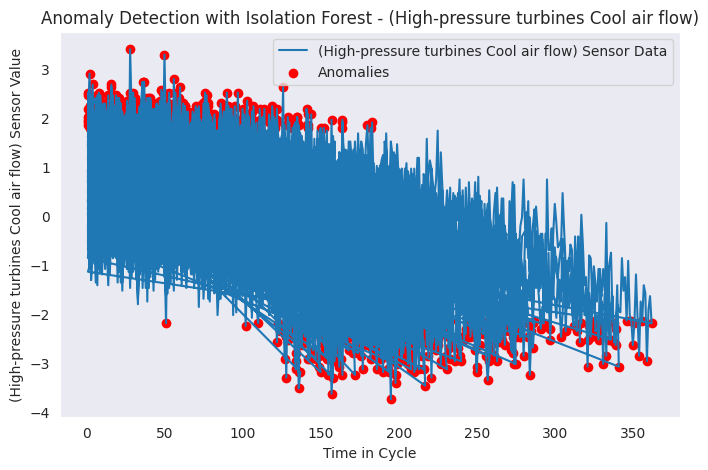

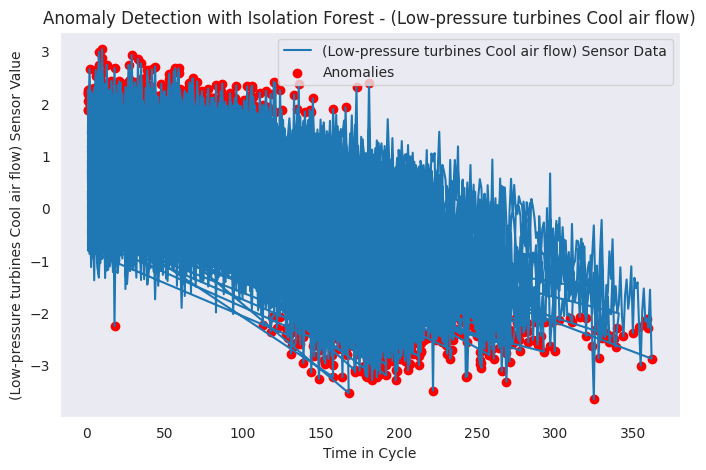

In [202]:
detect_sensor_anomalies(FD001, dict_list)